In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import scatter_matrix

from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier

from scipy.stats import f_oneway
import numpy as np


### Carga de dataset

In [1]:
def draw_histograms(df, variables, n_rows, n_cols):
    fig=plt.figure(figsize=(15, 8))
    for i, var_name in enumerate(variables):
        ax=fig.add_subplot(n_rows,n_cols,i+1)
        df[var_name].hist(bins=50,ax=ax, facecolor='midnightblue', edgecolor='black')
        title_obj = ax.set_title(var_name+" Distribution")
        plt.setp(title_obj, color='black')                     # Individual title colours.

        # remove grid lines
        ax.grid(False)

        ax.xaxis.label.set_color('black')  
        ax.yaxis.label.set_color('black')          
        ax.tick_params(axis='x', colors='black')       #set the color of xticks
        ax.tick_params(axis='y', colors='black')       #set the color of yticks
        
    fig.tight_layout()  # Improves appearance a bit.
    plt.show()

In [3]:
# Paso 1 - Creadondo data set de prueba
df = pd.read_csv("data/fact_application_v2.csv")
df

,applicationcode,redsecuritydensity,yellowsecuritydensity,redfaulttolerancedensity,yellowfaulttolerancedensity,redperformancedensity,yellowperformancedensity,redcostoptimizingdensity,yellowcostoptimizingdensity,pdnresourcessize
0,app00035,0.038,0.077,0.000,0.000,0.0,0.000,0.0,0.0,1.415
1,app00032,0.014,0.058,0.000,0.029,0.0,0.000,0.0,0.0,1.839
2,app00036,0.000,0.012,0.000,0.002,0.0,0.000,0.0,0.0,2.814
3,app00031,0.000,0.026,0.000,0.051,0.0,0.000,0.0,0.0,1.591
4,app00033,0.016,0.016,0.000,0.000,0.0,0.000,0.0,0.0,1.806
...,...,...,...,...,...,...,...,...,...,...
648,app00882,0.069,0.092,0.023,0.011,0.0,0.000,0.0,0.0,1.940
649,app00069,0.000,0.032,0.000,0.016,0.0,0.000,0.0,0.0,1.799
650,app00068,0.000,0.167,0.000,0.100,0.0,0.033,0.0,0.0,1.477
651,app00066,0.000,0.013,0.000,0.000,0.0,0.000,0.0,0.0,1.875


In [56]:
df.describe()

,redsecuritydensity,yellowsecuritydensity,redfaulttolerancedensity,yellowfaulttolerancedensity,redperformancedensity,yellowperformancedensity,redcostoptimizingdensity,yellowcostoptimizingdensity,pdnresourcessize
count,653.000000,653.000000,653.000000,653.000000,653.000000,653.000000,653.000000,653.000000,653.000000
mean,0.027322,0.090749,0.005496,0.045643,0.000028,0.005798,0.000020,0.000544,1.622894
std,0.068309,0.120340,0.031505,0.078281,0.000501,0.019052,0.000437,0.004374,0.669225
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.301000
25%,0.000000,0.015000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.176000
50%,0.000000,0.053000,0.000000,0.021000,0.000000,0.000000,0.000000,0.000000,1.785000
75%,0.023000,0.108000,0.000000,0.051000,0.000000,0.003000,0.000000,0.000000,2.057000
max,0.667000,1.000000,0.500000,0.500000,0.010000,0.250000,0.011000,0.061000,3.972000


In [57]:
# Porcentaje de 0s de cada columna
(df == 0).sum()/len(df) * 100

applicationcode                 0.000000
redsecuritydensity             50.382848
yellowsecuritydensity          16.385911
redfaulttolerancedensity       87.595712
yellowfaulttolerancedensity    30.627871
redperformancedensity          99.693721
yellowperformancedensity       73.813170
redcostoptimizingdensity       99.693721
yellowcostoptimizingdensity    97.549770
pdnresourcessize                0.000000
dtype: float64

In [58]:
df.dtypes

applicationcode                 object
redsecuritydensity             float64
yellowsecuritydensity          float64
redfaulttolerancedensity       float64
yellowfaulttolerancedensity    float64
redperformancedensity          float64
yellowperformancedensity       float64
redcostoptimizingdensity       float64
yellowcostoptimizingdensity    float64
pdnresourcessize               float64
dtype: object

Eliminamos las columnas que no aportan valor al modelo. En este caso estás columnas tienen un único valor, o son categorias que no pueden ser utilizadas en el modelo. La variable `applicationcode` es un identificador de cada aplicación desplegada, se deja en el dataset dado que puede ser utilizada para explicar el modelo y dar interpretabilidad a los clusters generados.

# Analisis de los datos
Esta etapa se encarga de analizar los datos para encontrar tendencias, correlaciones y patrones. En esta etapa se pueden utilizar herramientas de visualización de datos para ayudar a identificar las características más importantes.

En total tenemos 24 caracteristicas cuantitativas y un identificador de cada aplicación.

In [59]:
# Paso 2 - Selección de características

# features = ['fullresourcescount','devresourcescount','qaresourcescount','pdnresourcescount','fullaccountscount','devaccountscount','qaaccountscount','pdnaccountscount','redsecuritycheckscount','redsecurityresourcescount']

features = ['RedSecurityChecksCount', 'RedSecurityResourcesCount',
            'YellowSecurityChecksCount', 'YellowSecurityResourcesCount',
            'RedFaultToleranceChecksCount', 'RedFaultToleranceResourcesCount',
            'YellowFaultToleranceChecksCount', 'YellowFaultToleranceResourcesCount',
            'RedPerformanceChecksCount', 'RedPerformanceResourcesCount',
            'YellowPerformanceChecksCount', 'YellowPerformanceResourcesCount',
            'RedCostOptimizingChecksCount', 'RedCostOptimizingResourcesCount',
            'YellowCostOptimizingChecksCount', 'YellowCostOptimizingResourcesCount'
           ]

features = df.columns.to_list()
# remove from features values applicationcode, snapshot_date, provider_id, organization_id and application_id
features.remove('applicationcode')



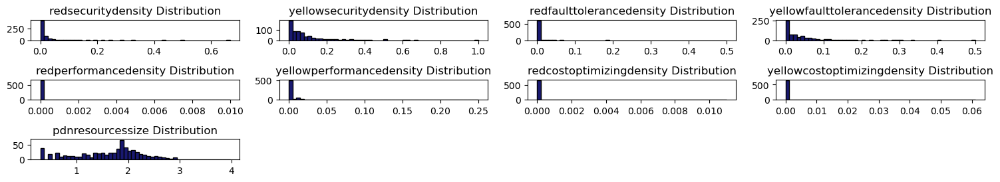

In [60]:
draw_histograms(df, features, 9, 4)

In [61]:
df[features].describe()

,redsecuritydensity,yellowsecuritydensity,redfaulttolerancedensity,yellowfaulttolerancedensity,redperformancedensity,yellowperformancedensity,redcostoptimizingdensity,yellowcostoptimizingdensity,pdnresourcessize
count,653.000000,653.000000,653.000000,653.000000,653.000000,653.000000,653.000000,653.000000,653.000000
mean,0.027322,0.090749,0.005496,0.045643,0.000028,0.005798,0.000020,0.000544,1.622894
std,0.068309,0.120340,0.031505,0.078281,0.000501,0.019052,0.000437,0.004374,0.669225
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.301000
25%,0.000000,0.015000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.176000
50%,0.000000,0.053000,0.000000,0.021000,0.000000,0.000000,0.000000,0.000000,1.785000
75%,0.023000,0.108000,0.000000,0.051000,0.000000,0.003000,0.000000,0.000000,2.057000
max,0.667000,1.000000,0.500000,0.500000,0.010000,0.250000,0.011000,0.061000,3.972000


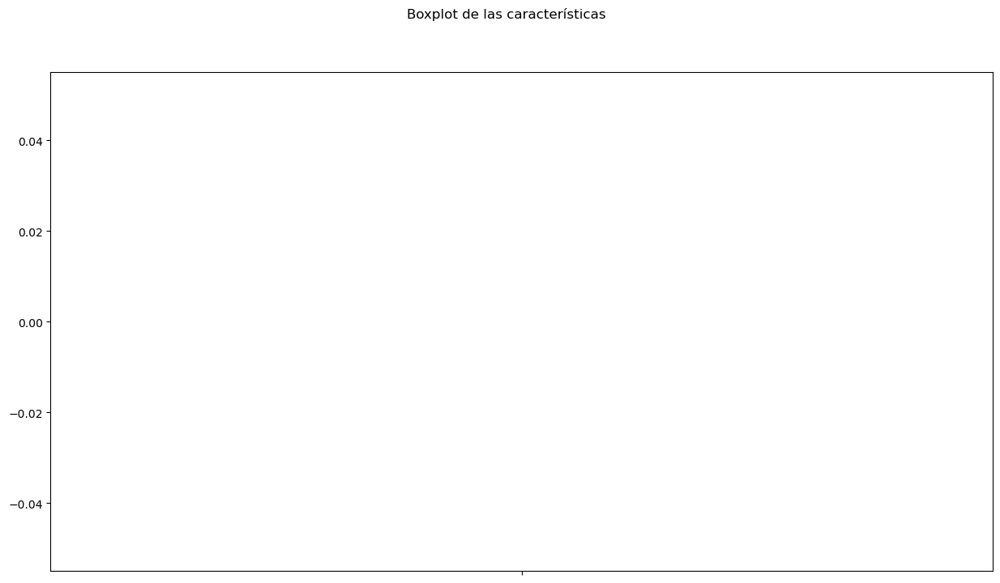

In [62]:
# boxplot algorithm comparison
fig = plt.figure(figsize=(15, 8))
fig.suptitle('Boxplot de las características')
ax = fig.add_subplot(111)
plt.boxplot(df[df.filter(regex='^Red|Yellow').columns])
ax.set_xticklabels(df[df.filter(regex='^Red|Yellow').columns].columns, rotation=90)
plt.show()

In [63]:
# get features where 75% is zero
features_to_remove = []
for feature in features:
    if df[feature].describe()['75%'] == 0:
        features_to_remove.append(feature)

features_to_remove

['redfaulttolerancedensity',
 'redperformancedensity',
 'redcostoptimizingdensity',
 'yellowcostoptimizingdensity']

Hay muchas caracteristicas con más del 75% de los datos en cero, esto puede generar mucho ruido al modelo por lo que deben tratarse. Estas marcas en cero corresponden a aplicaciones que no cuentan con checks en rojo o amarillo para el pilar definido. 
<br> Vamos a separa un dataframe por pilar para ver el comportamiento de los datos.

## Separación por pilar Security

In [64]:
# general features
df_accounts = df.filter(regex='Account')
df_resources = df.filter(regex='(Full|Dev|Qa|Pdn)ResourcesCount')
# create dataframe only with columns that contains SecurityChecksCount in the name
df_sec = df.filter(regex='Security')
#df_sec = pd.concat([df['applicationcode'], df_resources, df_accounts, df_sec], axis=1)
# enfocandose en solo produccion
df_sec = pd.concat([df['applicationcode'], df['PdnResourcesCount'], df['PdnAccountsCount'], df_sec], axis=1)

df_sec

KeyError: 'PdnResourcesCount'

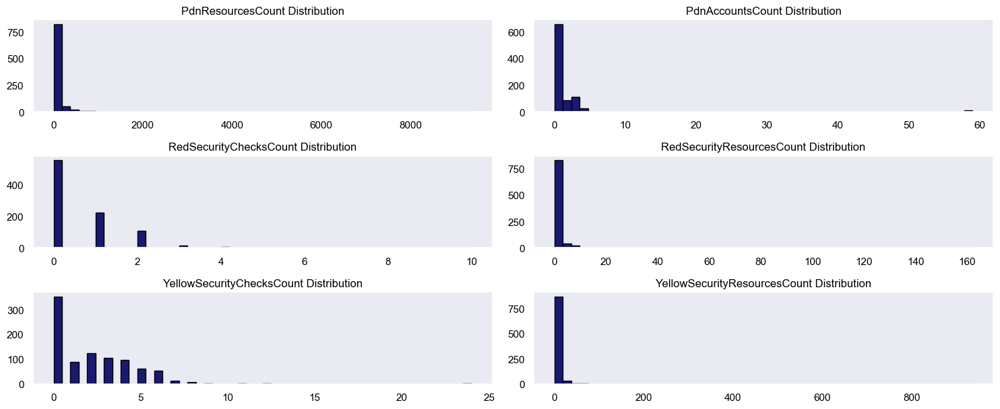

In [ ]:
sec_features = df_sec.columns.to_list()
sec_features.remove('applicationcode')
draw_histograms(df_sec, sec_features, 4, 2)

Para las aplicaciones que no tienen checks los campos ChecksCount y ResourceCount serán igual a cero. Dicho de otra manera, si el ChecksCount es cero, el ResourceCount también lo será. Por lo tanto, se van a eliminar todas las aplicaciones cuyos checks de seguridad son cero, dado que no interesan para el análisis de las aplicaciones con checks de seguridad.

In [ ]:
# count zeros for every column
(df_sec == 0).sum()/len(df_sec) * 100

In [ ]:
# remove rows where YellowSecurityChecksCount is zero
print(df_sec.shape)
df_sec = df_sec[df_sec['YellowSecurityChecksCount'] != 0]
df_sec = df_sec[df_sec['RedSecurityChecksCount'] != 0]

print(df_sec.shape)


(912, 7)
(353, 7)


Quedán 353 aplicaciones después de realizar el filtro, vamos a ver el histograma para ver la nueva distribución.

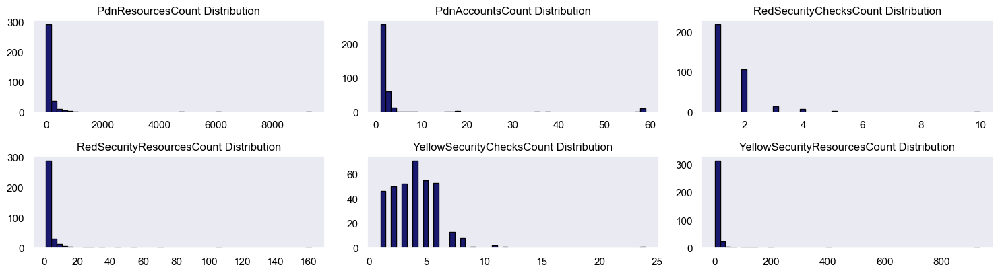

In [ ]:
draw_histograms(df_sec, sec_features, 4, 3)

In [ ]:
df_sec.describe()

,PdnResourcesCount,PdnAccountsCount,RedSecurityChecksCount,RedSecurityResourcesCount,YellowSecurityChecksCount,YellowSecurityResourcesCount
count,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000
mean,175.784703,3.943343,1.504249,4.359773,3.968839,14.895184
std,653.438157,10.681982,0.863140,12.354759,2.239025,56.793364
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,31.000000,1.000000,1.000000,1.000000,2.000000,3.000000
50%,77.000000,1.000000,1.000000,2.000000,4.000000,7.000000
75%,136.000000,3.000000,2.000000,3.000000,5.000000,12.000000
max,9369.000000,59.000000,10.000000,162.000000,24.000000,936.000000


Algunos diagramas de correlación entre variables

C:\Users\fede_\AppData\Local\Temp\ipykernel_24148\968516648.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df_sec.corr(), annot=True, cmap="YlGnBu")


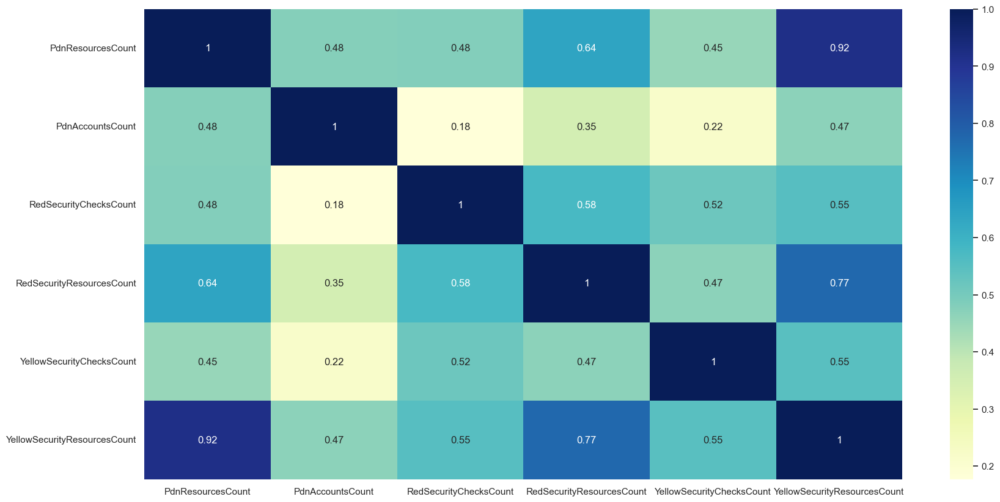

In [ ]:
# heatmap of correlation
plt.figure(figsize=(20,10))
sns.heatmap(df_sec.corr(), annot=True, cmap="YlGnBu")
plt.show()


Conclusiones aquí:
- Hay una correlación entre el conteo de recursos con checks amarillo y la cantidad de recursos por aplicación en Pdn. Es decir, la mayoria de aplicaciones en producción, tienen recursos con checks de riesgo medio.
- Hay una correlación entre los checks rojos y los checks amarillos para una aplicación.
- La información de las cuentas `PdnAccountsCount` donde esta desplegada la aplicación, no tiene mucha relación con los checks de seguridad marcados.


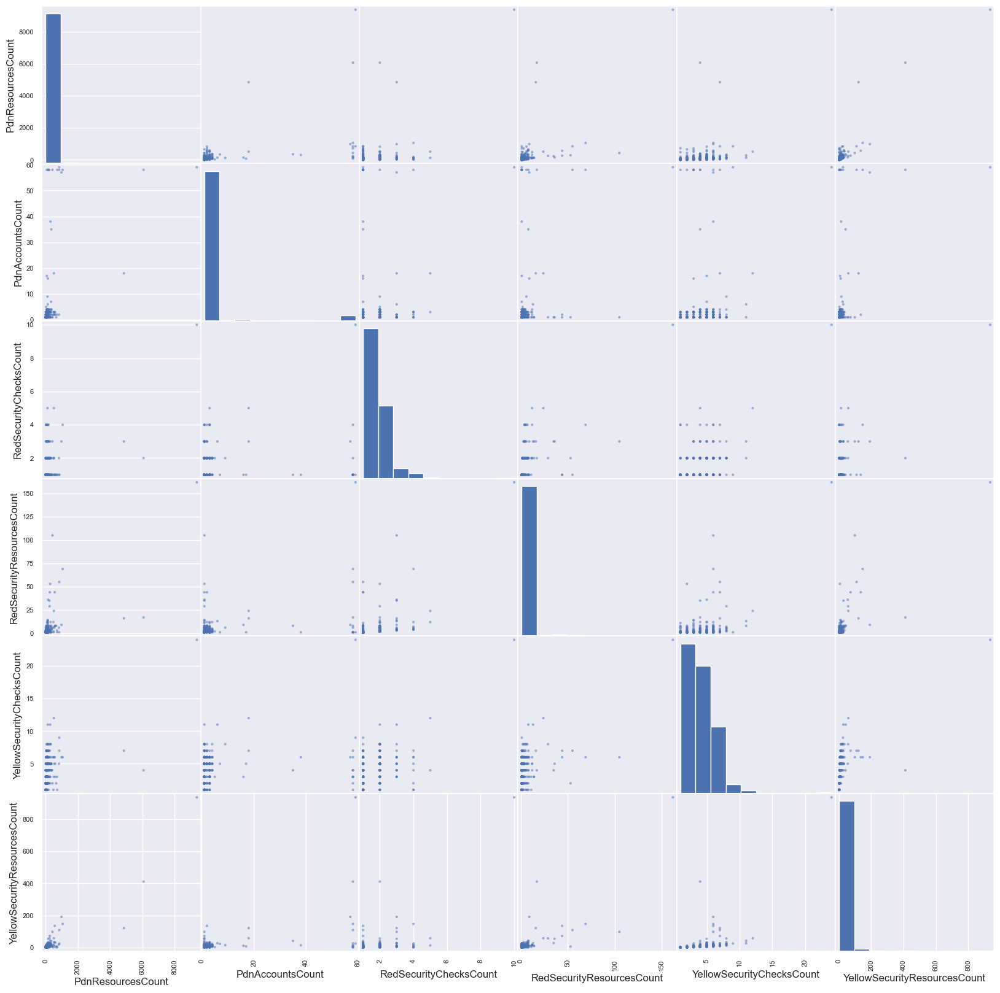

In [ ]:
# scatterplot matrix
scatter_matrix(df_sec, figsize=(20, 20))
plt.show()

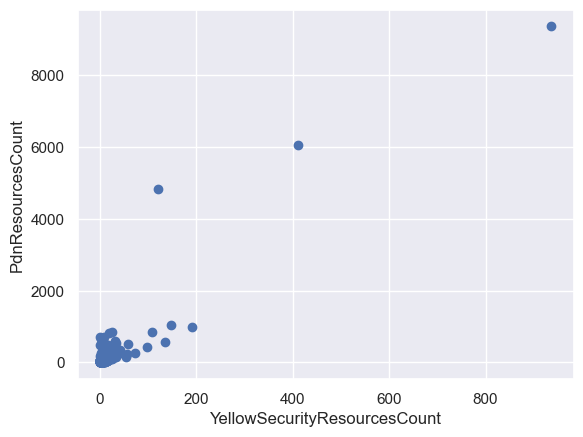

In [ ]:
# scatterplot between YellowSecurityResourcesCount and PdnResourcesCount
plt.scatter(df_sec['YellowSecurityResourcesCount'], df_sec['PdnResourcesCount'])
plt.xlabel('YellowSecurityResourcesCount')
plt.ylabel('PdnResourcesCount')
plt.show()

Ejecutemos una clusterización solo para los checks de seguridad

In [ ]:
df_sec

,applicationcode,PdnResourcesCount,PdnAccountsCount,RedSecurityChecksCount,RedSecurityResourcesCount,YellowSecurityChecksCount,YellowSecurityResourcesCount
0,app00609,182,1,2,3,5,12
2,app00610,92,3,1,1,5,11
3,app00614,27,1,1,1,4,11
8,app00586,839,59,1,1,9,25
9,app00587,42,1,1,1,7,14
...,...,...,...,...,...,...,...
903,app00089,30,1,1,2,1,2
904,app00659,481,2,2,12,6,15
908,app00661,24,1,1,1,4,11
909,app00658,31,2,2,4,7,10


In [ ]:
# normalize data
scaler = StandardScaler()
df_sec_scaled = scaler.fit_transform(df_sec.drop(columns=['applicationcode']))
# index to keep the index of df_sec
df_sec_scaled = pd.DataFrame(df_sec_scaled, columns=df_sec.drop(columns=['applicationcode']).columns, index=df_sec.index)
#concat df_sec_scaled with applicationcode
df_sec_scaled = pd.concat([df_sec['applicationcode'], df_sec_scaled], axis=1)
df_sec_scaled

,applicationcode,PdnResourcesCount,PdnAccountsCount,RedSecurityChecksCount,RedSecurityResourcesCount,YellowSecurityChecksCount,YellowSecurityResourcesCount
0,app00609,0.009525,-0.275934,0.575173,-0.110217,0.461194,-0.051050
2,app00610,-0.128403,-0.088437,-0.585033,-0.272328,0.461194,-0.068683
3,app00614,-0.228018,-0.275934,-0.585033,-0.272328,0.013937,-0.068683
8,app00586,1.016403,5.161477,-0.585033,-0.272328,2.250222,0.178175
9,app00587,-0.205030,-0.275934,-0.585033,-0.272328,1.355708,-0.015784
...,...,...,...,...,...,...,...
903,app00089,-0.223421,-0.275934,-0.585033,-0.191272,-1.327834,-0.227377
904,app00659,0.467754,-0.182185,0.575173,0.619281,0.908451,0.001848
908,app00661,-0.232616,-0.275934,-0.585033,-0.272328,0.013937,-0.068683
909,app00658,-0.221888,-0.182185,0.575173,-0.029162,1.355708,-0.086315


c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


<Axes: xlabel='RedSecurityChecksCount', ylabel='RedSecurityResourcesCount'>

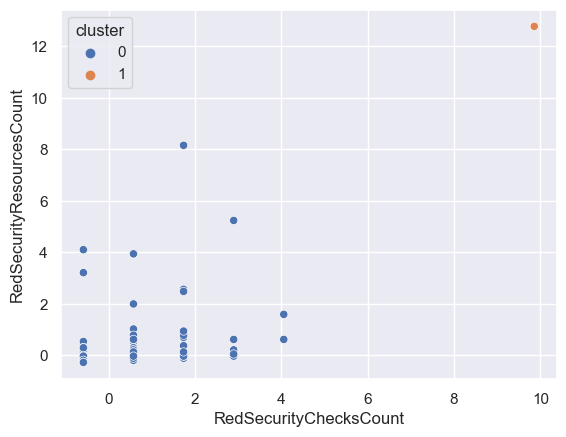

In [ ]:
# kmeans with 2 clusters
kmeans = KMeans(n_clusters=2, random_state=0).fit(df_sec_scaled.drop(columns=['applicationcode']))
kmeans.labels_

# add cluster column to df_sec_scaled
df_sec_scaled['cluster'] = kmeans.labels_
df_sec_scaled

# get cluster 0
df_cluster_0 = df_sec_scaled[df_sec_scaled['cluster'] == 0]
df_cluster_0

# get cluster 1
df_cluster_1 = df_sec_scaled[df_sec_scaled['cluster'] == 1]
df_cluster_1

# plot cluster 0
# Gráfica de dispersión
sns.set_theme(style="darkgrid")
sns.scatterplot(data=df_sec_scaled, x="RedSecurityChecksCount", y="RedSecurityResourcesCount", hue="cluster", palette="deep")

In [ ]:
# analize clusters
df_cluster_0.describe()



,PdnResourcesCount,PdnAccountsCount,RedSecurityChecksCount,RedSecurityResourcesCount,YellowSecurityChecksCount,YellowSecurityResourcesCount,cluster
count,352.000000,352.000000,352.000000,352.000000,352.000000,352.000000,352.0
mean,-0.040025,-0.014663,-0.028002,-0.036300,-0.025452,-0.046141,0.0
std,0.662244,0.964149,0.853295,0.734322,0.881120,0.502026,0.0
min,-0.267864,-0.275934,-0.585033,-0.272328,-1.327834,-0.245009,0.0
25%,-0.221888,-0.275934,-0.585033,-0.272328,-0.880577,-0.209744,0.0
50%,-0.152158,-0.275934,-0.585033,-0.191272,0.013937,-0.139213,0.0
75%,-0.060972,-0.088437,0.575173,-0.110217,0.461194,-0.051050,0.0
max,9.025452,5.161477,4.055789,8.157430,3.591993,6.984391,0.0


In [ ]:
df_cluster_1.describe()

,PdnResourcesCount,PdnAccountsCount,RedSecurityChecksCount,RedSecurityResourcesCount,YellowSecurityChecksCount,YellowSecurityResourcesCount,cluster
count,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.0
mean,14.088961,5.161477,9.856816,12.777585,8.959078,16.24155,1.0
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,14.088961,5.161477,9.856816,12.777585,8.959078,16.24155,1.0
25%,14.088961,5.161477,9.856816,12.777585,8.959078,16.24155,1.0
50%,14.088961,5.161477,9.856816,12.777585,8.959078,16.24155,1.0
75%,14.088961,5.161477,9.856816,12.777585,8.959078,16.24155,1.0
max,14.088961,5.161477,9.856816,12.777585,8.959078,16.24155,1.0


In [ ]:
# export to csv
df_sec_scaled.to_csv('df_sec_clusters.csv', index=False)

Genero un cluster con un elemento, debido a que es un atípico y no se encontraron más vecinos en el algoritmo. Rapidamente se podría inferir que los dos grupos aquí corresponden a aplicaciones con muchos (más de 5) checks de seguridad y aplicaciones con pocos (menos de 5) checks de seguridad. 
<br> Probemos con eliminación de atípicos.

In [ ]:
df_sec.describe()

,PdnResourcesCount,PdnAccountsCount,RedSecurityChecksCount,RedSecurityResourcesCount,YellowSecurityChecksCount,YellowSecurityResourcesCount
count,353.000000,353.000000,353.000000,353.000000,353.000000,353.000000
mean,175.784703,3.943343,1.504249,4.359773,3.968839,14.895184
std,653.438157,10.681982,0.863140,12.354759,2.239025,56.793364
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,31.000000,1.000000,1.000000,1.000000,2.000000,3.000000
50%,77.000000,1.000000,1.000000,2.000000,4.000000,7.000000
75%,136.000000,3.000000,2.000000,3.000000,5.000000,12.000000
max,9369.000000,59.000000,10.000000,162.000000,24.000000,936.000000


In [ ]:
# remove outliers from df_sec
print(df_sec.shape)
df_sec = df_sec[df_sec['RedSecurityChecksCount'] < 10]
df_sec = df_sec[df_sec['YellowSecurityChecksCount'] < 10]
print(df_sec.shape)

(353, 7)
(349, 7)


In [ ]:
df_sec.describe()

,PdnResourcesCount,PdnAccountsCount,RedSecurityChecksCount,RedSecurityResourcesCount,YellowSecurityChecksCount,YellowSecurityResourcesCount
count,349.000000,349.000000,349.000000,349.000000,349.000000,349.000000
mean,148.335244,3.747851,1.464183,3.816619,3.848138,12.020057
std,433.500440,10.298673,0.708735,9.018223,1.853043,28.431853
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,31.000000,1.000000,1.000000,1.000000,2.000000,3.000000
50%,76.000000,1.000000,1.000000,2.000000,4.000000,7.000000
75%,135.000000,3.000000,2.000000,3.000000,5.000000,12.000000
max,6065.000000,59.000000,5.000000,105.000000,9.000000,411.000000


c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


<Axes: xlabel='RedSecurityChecksCount', ylabel='RedSecurityResourcesCount'>

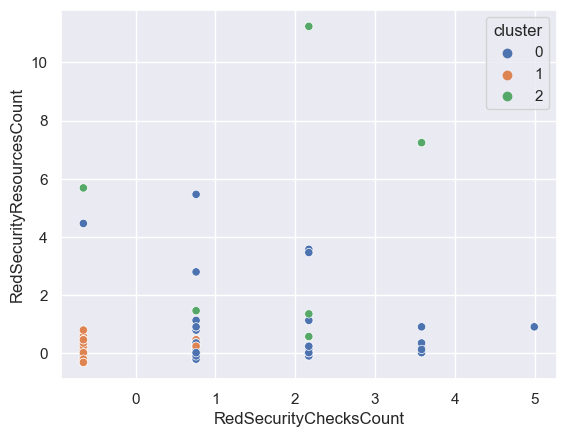

In [ ]:
# run kmeans again 
# normalize data
scaler = StandardScaler()
df_sec_scaled = scaler.fit_transform(df_sec.drop(columns=['applicationcode']))
# index to keep the index of df_sec
df_sec_scaled = pd.DataFrame(df_sec_scaled, columns=df_sec.drop(columns=['applicationcode']).columns, index=df_sec.index)
#concat df_sec_scaled with applicationcode
df_sec_scaled = pd.concat([df_sec['applicationcode'], df_sec_scaled], axis=1)

# kmeans with 2 clusters
kmeans = KMeans(n_clusters=3, random_state=0).fit(df_sec_scaled.drop(columns=['applicationcode']))

# add cluster column to df_sec_scaled
df_sec_scaled['cluster'] = kmeans.labels_

# get cluster 0
df_cluster_0 = df_sec_scaled[df_sec_scaled['cluster'] == 0]

# get cluster 1
df_cluster_1 = df_sec_scaled[df_sec_scaled['cluster'] == 1]

# plot cluster 0
# Gráfica de dispersión
sns.set_theme(style="darkgrid")
sns.scatterplot(data=df_sec_scaled, x="RedSecurityChecksCount", y="RedSecurityResourcesCount", hue="cluster", palette="deep")


De esta manera los clusters son mucho más variados y complejos de explicar. Aquí el desafio es la interpretabilidad. Este proceso debería hacerse para cada uno de los pilares. De aquí se extraen unos grupos, que pueden ser utilizados para entrenar un modelo de clasificación o se puede hacer una nueva clusterización.

c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


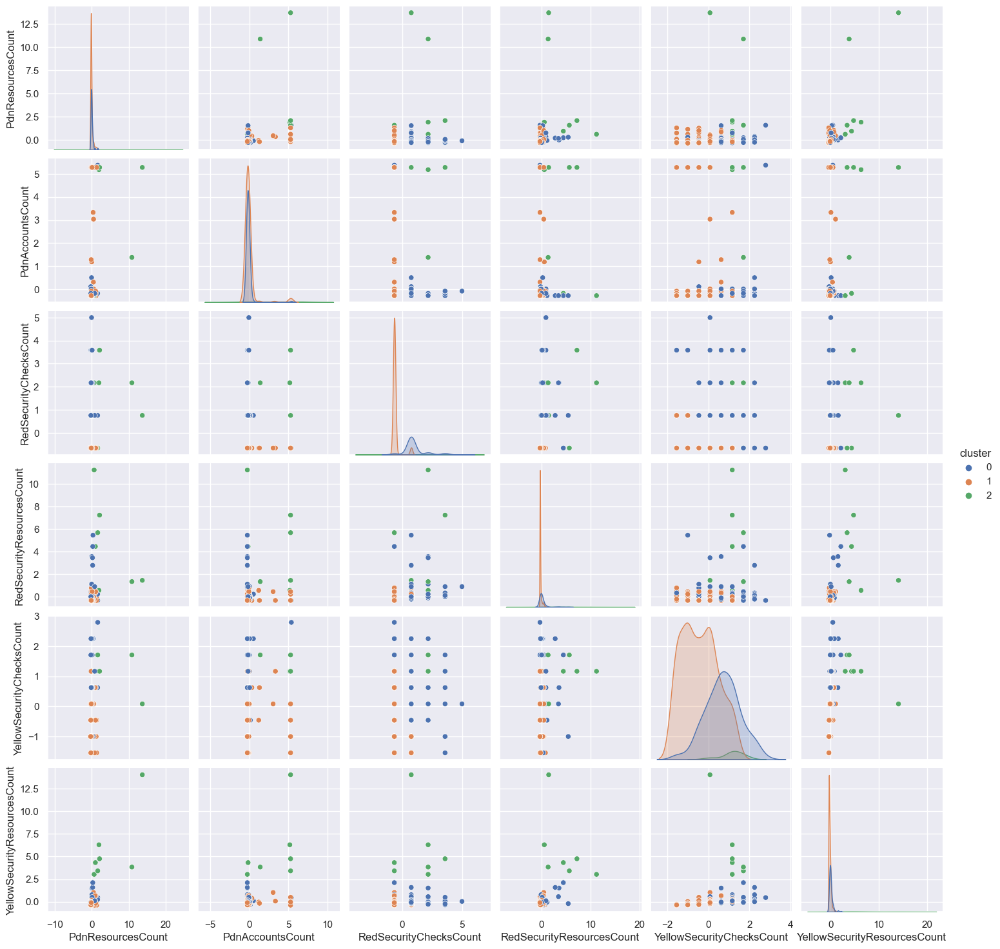

In [ ]:
# scatter_matrix using sns
sns.pairplot(df_sec_scaled, hue="cluster", palette="deep")
plt.show()

Los grupos que se forman por el conteo de recursos marcados `RedSecurityResourcesCount` y `YellowSecurityResourcesCount` muestran que se generan 3 grupos: uno con pocos recursos con checks, otro con muchos recursos con checks y otro con una cantidad intermedia de recursos con checks. Las variables de ChecksCount creo que no aporta mucho, porque poco importa si una aplicación tiene 2 o 10 checks de seguridad, lo que importa es la cantidad de recursos con checks de seguridad... la cantidad de diferentes checks marcados podría ser más una desviación.

In [ ]:
# export to csv
df_sec_scaled.to_csv('df_sec_clusters3.csv', index=False)

In [ ]:
# concat df_sec with clusters
df_sec = pd.concat([df_sec, df_sec_scaled['cluster']], axis=1)
df_sec


,applicationcode,PdnResourcesCount,PdnAccountsCount,RedSecurityChecksCount,RedSecurityResourcesCount,YellowSecurityChecksCount,YellowSecurityResourcesCount,cluster
0,app00609,182,1,2,3,5,12,0
2,app00610,92,3,1,1,5,11,1
3,app00614,27,1,1,1,4,11,1
8,app00586,839,59,1,1,9,25,0
9,app00587,42,1,1,1,7,14,0
...,...,...,...,...,...,...,...,...
903,app00089,30,1,1,2,1,2,1
904,app00659,481,2,2,12,6,15,0
908,app00661,24,1,1,1,4,11,1
909,app00658,31,2,2,4,7,10,0


In [ ]:
# export csv
df_sec.to_csv('df_sec.csv', index=False)



## Cluster con k 5, solo checks
Vamos a hacer una clusterización teniendo en cuenta unicamente los checks.
- Solo datos de producción (682)
- Se ignora conteo de recursos y conteo de cuentas de la aplicación.
- Detección de atípicos
- KMeans con 3 y 5 clusters

In [ ]:
# remove from df those with 0 in PdnResourcesCount
print(df.shape)
df = df[df['PdnResourcesCount'] != 0]
print(df.shape)

(912, 25)
(682, 25)


In [ ]:
# create dataframe only with columns that contains SecurityChecksCount in the name
df_checks = df.filter(regex='(Security|FaultTolerance|Performance|CostOptimizing)')
#df_sec = pd.concat([df['applicationcode'], df_resources, df_accounts, df_sec], axis=1)
# enfocandose en solo produccion
df_checks = pd.concat([df['applicationcode'], df_checks], axis=1)

df_checks

,applicationcode,RedSecurityChecksCount,RedSecurityResourcesCount,YellowSecurityChecksCount,YellowSecurityResourcesCount,RedFaultToleranceChecksCount,RedFaultToleranceResourcesCount,YellowFaultToleranceChecksCount,YellowFaultToleranceResourcesCount,RedPerformanceChecksCount,RedPerformanceResourcesCount,YellowPerformanceChecksCount,YellowPerformanceResourcesCount,RedCostOptimizingChecksCount,RedCostOptimizingResourcesCount,YellowCostOptimizingChecksCount,YellowCostOptimizingResourcesCount
0,app00609,2,3,5,12,0,0,2,5,0,0,1,1,0,0,0,0
2,app00610,1,1,5,11,1,1,1,2,0,0,0,0,0,0,0,0
3,app00614,1,1,4,11,0,0,1,1,0,0,1,1,0,0,0,0
4,app00612,0,0,2,2,1,1,3,9,0,0,0,0,0,0,0,0
5,app00616,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
906,app00657,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
907,app00655,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
908,app00661,1,1,4,11,0,0,3,5,0,0,0,0,0,0,0,0
909,app00658,2,4,7,10,0,0,1,2,0,0,1,1,0,0,0,0


In [ ]:
df_checks.describe()

,RedSecurityChecksCount,RedSecurityResourcesCount,YellowSecurityChecksCount,YellowSecurityResourcesCount,RedFaultToleranceChecksCount,RedFaultToleranceResourcesCount,YellowFaultToleranceChecksCount,YellowFaultToleranceResourcesCount,RedPerformanceChecksCount,RedPerformanceResourcesCount,YellowPerformanceChecksCount,YellowPerformanceResourcesCount,RedCostOptimizingChecksCount,RedCostOptimizingResourcesCount,YellowCostOptimizingChecksCount,YellowCostOptimizingResourcesCount
count,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000,682.000000
mean,0.790323,2.272727,2.802053,9.611437,0.142229,0.791789,0.972141,3.290323,0.002933,0.002933,0.296188,0.507331,0.002933,0.002933,0.026393,0.164223
std,0.974729,9.143920,2.271019,42.193980,0.385500,5.598200,0.903957,10.999701,0.054113,0.054113,0.539443,1.972819,0.054113,0.054113,0.160419,1.552605
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,1.000000,3.000000,4.000000,0.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,2.000000,4.000000,8.750000,0.000000,0.000000,1.000000,3.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,10.000000,162.000000,24.000000,936.000000,3.000000,95.000000,4.000000,227.000000,1.000000,1.000000,3.000000,41.000000,1.000000,1.000000,1.000000,25.000000


In [ ]:
# normalize data
scaler = StandardScaler()
df_checks_scaled = scaler.fit_transform(df_checks.drop(columns=['applicationcode']))
# index to keep the index of df_sec
df_checks_scaled = pd.DataFrame(df_checks_scaled, columns=df_checks.drop(columns=['applicationcode']).columns, index=df_checks.index)
#concat df_sec_scaled with applicationcode
df_checks_scaled = pd.concat([df_checks['applicationcode'], df_checks_scaled], axis=1)
df_checks_scaled

,applicationcode,RedSecurityChecksCount,RedSecurityResourcesCount,YellowSecurityChecksCount,YellowSecurityResourcesCount,RedFaultToleranceChecksCount,RedFaultToleranceResourcesCount,YellowFaultToleranceChecksCount,YellowFaultToleranceResourcesCount,RedPerformanceChecksCount,RedPerformanceResourcesCount,YellowPerformanceChecksCount,YellowPerformanceResourcesCount,RedCostOptimizingChecksCount,RedCostOptimizingResourcesCount,YellowCostOptimizingChecksCount,YellowCostOptimizingResourcesCount
0,app00609,1.241950,0.079595,0.968534,0.056651,-0.369217,-0.14154,1.137902,0.155544,-0.054233,-0.054233,1.305660,0.249911,-0.054233,-0.054233,-0.164646,-0.10585
2,app00610,0.215271,-0.139291,0.968534,0.032933,2.226718,0.03722,0.030842,-0.117391,-0.054233,-0.054233,-0.549465,-0.257349,-0.054233,-0.054233,-0.164646,-0.10585
3,app00614,0.215271,-0.139291,0.527880,0.032933,-0.369217,-0.14154,0.030842,-0.208370,-0.054233,-0.054233,1.305660,0.249911,-0.054233,-0.054233,-0.164646,-0.10585
4,app00612,-0.811408,-0.248733,-0.353428,-0.180524,2.226718,0.03722,2.244961,0.519457,-0.054233,-0.054233,-0.549465,-0.257349,-0.054233,-0.054233,-0.164646,-0.10585
5,app00616,-0.811408,-0.248733,-1.234736,-0.227959,-0.369217,-0.14154,-1.076218,-0.299348,-0.054233,-0.054233,-0.549465,-0.257349,-0.054233,-0.054233,-0.164646,-0.10585
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
906,app00657,-0.811408,-0.248733,-0.794082,-0.204241,-0.369217,-0.14154,-1.076218,-0.299348,-0.054233,-0.054233,-0.549465,-0.257349,-0.054233,-0.054233,-0.164646,-0.10585
907,app00655,-0.811408,-0.248733,-1.234736,-0.227959,-0.369217,-0.14154,-1.076218,-0.299348,-0.054233,-0.054233,-0.549465,-0.257349,-0.054233,-0.054233,-0.164646,-0.10585
908,app00661,0.215271,-0.139291,0.527880,0.032933,-0.369217,-0.14154,2.244961,0.155544,-0.054233,-0.054233,-0.549465,-0.257349,-0.054233,-0.054233,-0.164646,-0.10585
909,app00658,1.241950,0.189037,1.849843,0.009216,-0.369217,-0.14154,0.030842,-0.117391,-0.054233,-0.054233,1.305660,0.249911,-0.054233,-0.054233,-0.164646,-0.10585


In [ ]:
# run kmens with 5 clusters
kmeans = KMeans(n_clusters=5, random_state=232).fit(df_checks_scaled.drop(columns=['applicationcode']))

# add cluster column to df_sec_scaled
df_checks_scaled['cluster'] = kmeans.labels_

# concat with df_checks
df_checks = pd.concat([df_checks, df_checks_scaled['cluster']], axis=1)

df_checks

c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


,applicationcode,RedSecurityChecksCount,RedSecurityResourcesCount,YellowSecurityChecksCount,YellowSecurityResourcesCount,RedFaultToleranceChecksCount,RedFaultToleranceResourcesCount,YellowFaultToleranceChecksCount,YellowFaultToleranceResourcesCount,RedPerformanceChecksCount,RedPerformanceResourcesCount,YellowPerformanceChecksCount,YellowPerformanceResourcesCount,RedCostOptimizingChecksCount,RedCostOptimizingResourcesCount,YellowCostOptimizingChecksCount,YellowCostOptimizingResourcesCount,cluster,cluster,cluster
0,app00609,2,3,5,12,0,0,2,5,0,0,1,1,0,0,0,0,0,4,3
2,app00610,1,1,5,11,1,1,1,2,0,0,0,0,0,0,0,0,0,4,3
3,app00614,1,1,4,11,0,0,1,1,0,0,1,1,0,0,0,0,0,4,3
4,app00612,0,0,2,2,1,1,3,9,0,0,0,0,0,0,0,0,1,0,1
5,app00616,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
906,app00657,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
907,app00655,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
908,app00661,1,1,4,11,0,0,3,5,0,0,0,0,0,0,0,0,0,4,3
909,app00658,2,4,7,10,0,0,1,2,0,0,1,1,0,0,0,0,0,4,3


In [ ]:
# count of clusters
df_checks_scaled['cluster'].value_counts()


1    436
3    233
0      9
2      2
4      2
Name: cluster, dtype: int64

c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


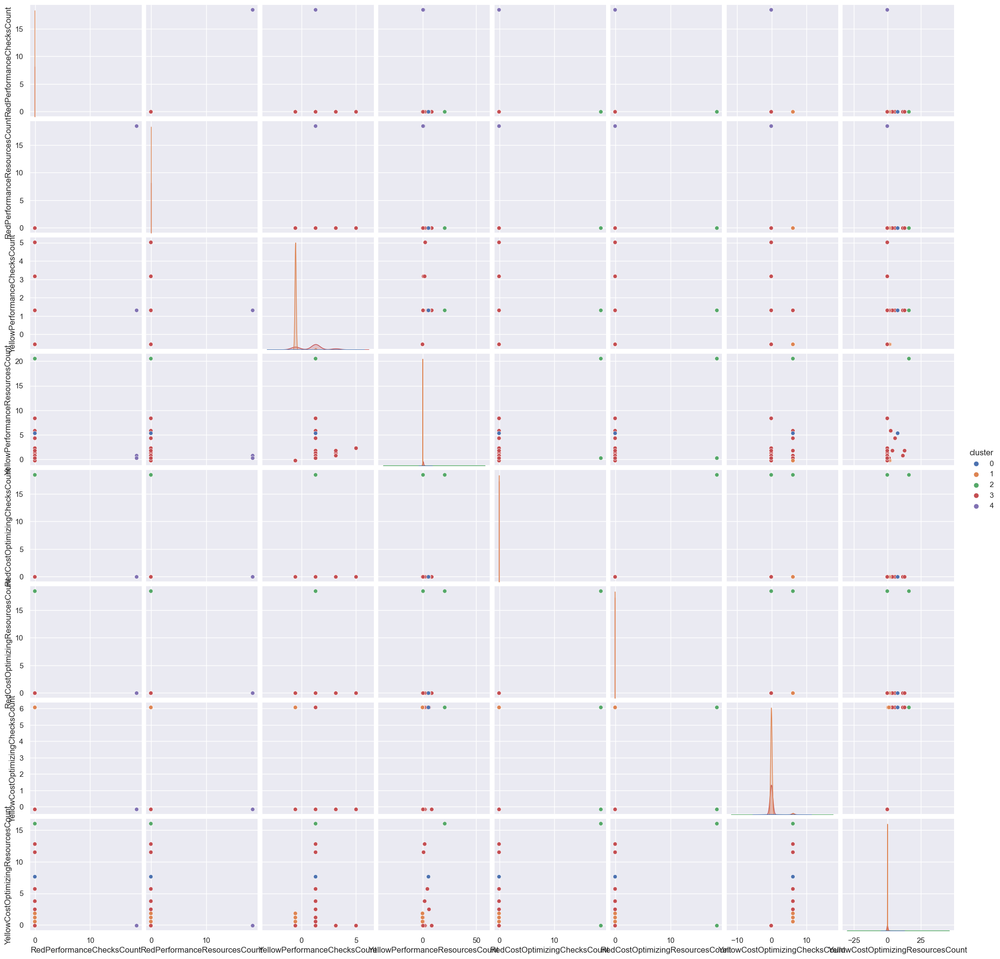

In [ ]:
#scatter_matrix using sns
sns.pairplot(df_checks_scaled[df_checks_scaled.filter(regex='CostOptimizing|Performance|cluster').columns], hue="cluster", palette="deep")
plt.show()


El cluster 2 se ve relevante para los pilares CostOptimizing y Performance. El cluster 1 es de aplicaciones con menos checks (entonces mayor nivel de madurez?), el cluster 3 es con algunos checks, y el cluster 0 se lleva los atípicos o aplicaciones con muchos checks. El cluster 4 se ve relevante para el pilar de Performance.

### Paso 4

In [ ]:
# Paso 4 - Elección del número de clústeres (K)
# Asuminos que sabemos el número de clústeres 4
K = 5

### Paso 5

In [ ]:
# Paso 5 - Aplicación del algoritmo K-Means
kmeans = KMeans(n_clusters=K, random_state=42)
df['Cluster'] = kmeans.fit_predict(df[features])

c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


<Axes: xlabel='RedSecurityChecksCount', ylabel='RedSecurityResourcesCount'>

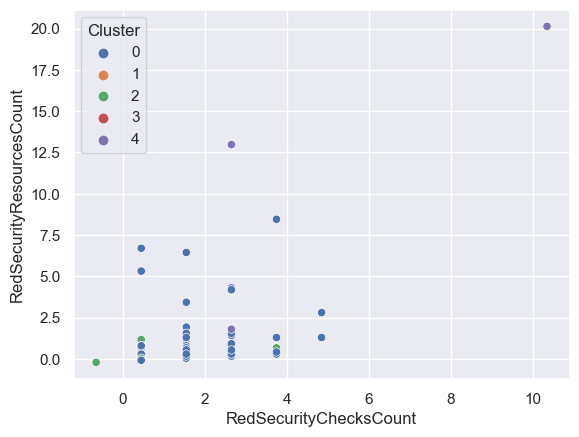

In [ ]:
# Paso 6 - Visualización de los resultados
# Gráfica de dispersión
sns.set_theme(style="darkgrid")
sns.scatterplot(data=df, x="RedSecurityChecksCount", y="RedSecurityResourcesCount", hue="Cluster", palette="deep")

# Análisis con Densidad

In [65]:
df0 = df.filter(regex='applicationcode|pdnresourcessize|density')
df0.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 653 entries, 0 to 652
Data columns (total 10 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   applicationcode              653 non-null    object 
 1   redsecuritydensity           653 non-null    float64
 2   yellowsecuritydensity        653 non-null    float64
 3   redfaulttolerancedensity     653 non-null    float64
 4   yellowfaulttolerancedensity  653 non-null    float64
 5   redperformancedensity        653 non-null    float64
 6   yellowperformancedensity     653 non-null    float64
 7   redcostoptimizingdensity     653 non-null    float64
 8   yellowcostoptimizingdensity  653 non-null    float64
 9   pdnresourcessize             653 non-null    float64
dtypes: float64(9), object(1)
memory usage: 51.1+ KB


In [66]:
df0

,applicationcode,redsecuritydensity,yellowsecuritydensity,redfaulttolerancedensity,yellowfaulttolerancedensity,redperformancedensity,yellowperformancedensity,redcostoptimizingdensity,yellowcostoptimizingdensity,pdnresourcessize
0,app00035,0.038,0.077,0.000,0.000,0.0,0.000,0.0,0.0,1.415
1,app00032,0.014,0.058,0.000,0.029,0.0,0.000,0.0,0.0,1.839
2,app00036,0.000,0.012,0.000,0.002,0.0,0.000,0.0,0.0,2.814
3,app00031,0.000,0.026,0.000,0.051,0.0,0.000,0.0,0.0,1.591
4,app00033,0.016,0.016,0.000,0.000,0.0,0.000,0.0,0.0,1.806
...,...,...,...,...,...,...,...,...,...,...
648,app00882,0.069,0.092,0.023,0.011,0.0,0.000,0.0,0.0,1.940
649,app00069,0.000,0.032,0.000,0.016,0.0,0.000,0.0,0.0,1.799
650,app00068,0.000,0.167,0.000,0.100,0.0,0.033,0.0,0.0,1.477
651,app00066,0.000,0.013,0.000,0.000,0.0,0.000,0.0,0.0,1.875


In [67]:
df[df['pdnresourcessize']!=0]   

,applicationcode,redsecuritydensity,yellowsecuritydensity,redfaulttolerancedensity,yellowfaulttolerancedensity,redperformancedensity,yellowperformancedensity,redcostoptimizingdensity,yellowcostoptimizingdensity,pdnresourcessize
0,app00035,0.038,0.077,0.000,0.000,0.0,0.000,0.0,0.0,1.415
1,app00032,0.014,0.058,0.000,0.029,0.0,0.000,0.0,0.0,1.839
2,app00036,0.000,0.012,0.000,0.002,0.0,0.000,0.0,0.0,2.814
3,app00031,0.000,0.026,0.000,0.051,0.0,0.000,0.0,0.0,1.591
4,app00033,0.016,0.016,0.000,0.000,0.0,0.000,0.0,0.0,1.806
...,...,...,...,...,...,...,...,...,...,...
648,app00882,0.069,0.092,0.023,0.011,0.0,0.000,0.0,0.0,1.940
649,app00069,0.000,0.032,0.000,0.016,0.0,0.000,0.0,0.0,1.799
650,app00068,0.000,0.167,0.000,0.100,0.0,0.033,0.0,0.0,1.477
651,app00066,0.000,0.013,0.000,0.000,0.0,0.000,0.0,0.0,1.875


In [68]:
df0 = df0[df0['pdnresourcessize'] != 0]
df0 = df0.dropna()
df0.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 653 entries, 0 to 652
Data columns (total 10 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   applicationcode              653 non-null    object 
 1   redsecuritydensity           653 non-null    float64
 2   yellowsecuritydensity        653 non-null    float64
 3   redfaulttolerancedensity     653 non-null    float64
 4   yellowfaulttolerancedensity  653 non-null    float64
 5   redperformancedensity        653 non-null    float64
 6   yellowperformancedensity     653 non-null    float64
 7   redcostoptimizingdensity     653 non-null    float64
 8   yellowcostoptimizingdensity  653 non-null    float64
 9   pdnresourcessize             653 non-null    float64
dtypes: float64(9), object(1)
memory usage: 56.1+ KB


<Axes: >

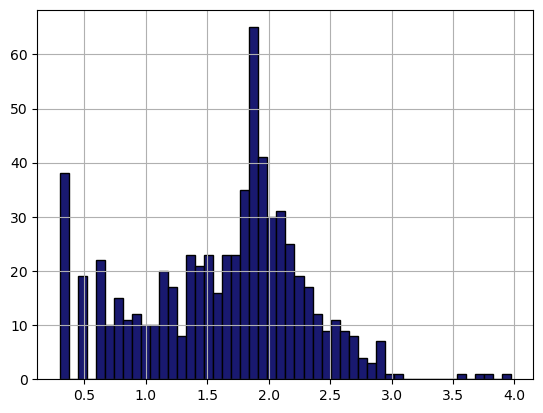

In [69]:
df0['pdnresourcessize'].hist(bins=50, facecolor='midnightblue', edgecolor='black')

Al realizar el logaritmo a la variable pdnresourcessize se encuentra una mejor distribución, y esto permite que el modelo pueda tener información sobre la carga de trabajo que esta siendo analizada.


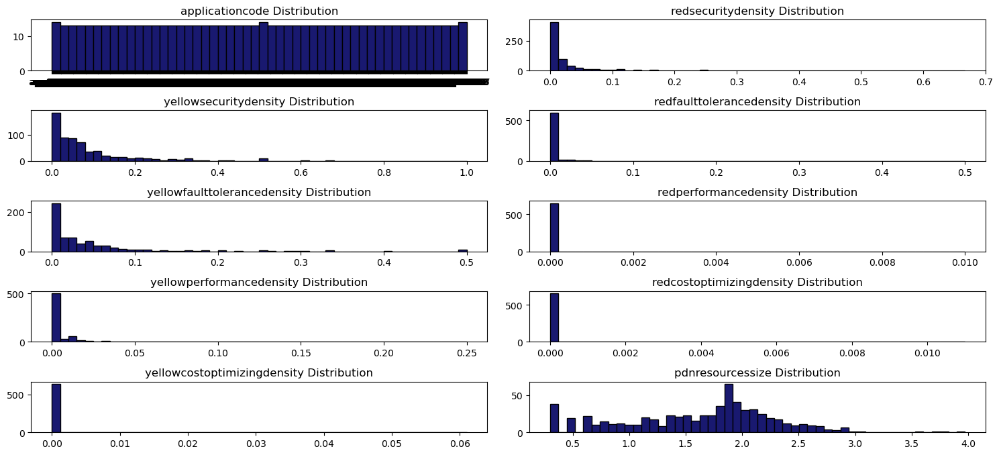

In [70]:
draw_histograms(df, df.columns, 6, 2)

In [71]:
features = df0.columns.to_list()
features.remove('applicationcode')

In [72]:
features

['redsecuritydensity',
 'yellowsecuritydensity',
 'redfaulttolerancedensity',
 'yellowfaulttolerancedensity',
 'redperformancedensity',
 'yellowperformancedensity',
 'redcostoptimizingdensity',
 'yellowcostoptimizingdensity',
 'pdnresourcessize']

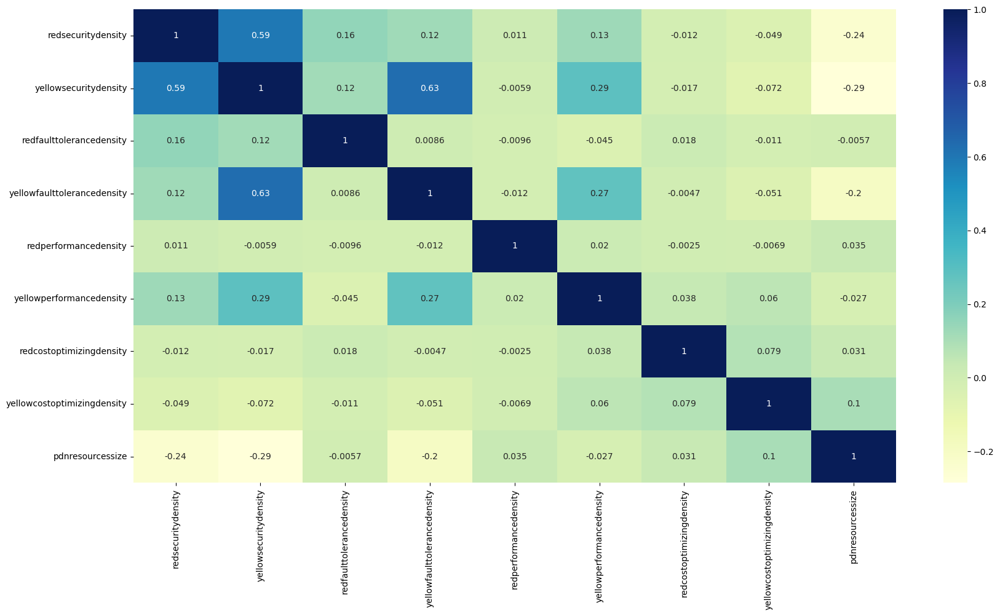

In [74]:
# heatmap of correlation
plt.figure(figsize=(20,10))
sns.heatmap(df0[features].corr(), annot=True, cmap="YlGnBu")
plt.show()

Se encuentra correlacion entre la densidad de los checks amarillos y rojos en el pilar de seguridad (yellowsecuritydensity y redsecuritydensity), también en otras variables como la densidad de checks amarillos del pilar de tolerancia de fallos con la densidad de checks rojos en el pilar seguridad (yellowfaulttolerancedensity y redsecuritydensity). En general las correlaciones no son tan grandes como para indicar redundancia en las dimensiones. La variable pdnresourcessize no tiene mucha correlación con el resto de variables. Esto es bueno porque significa que puede aportar información al modelo.

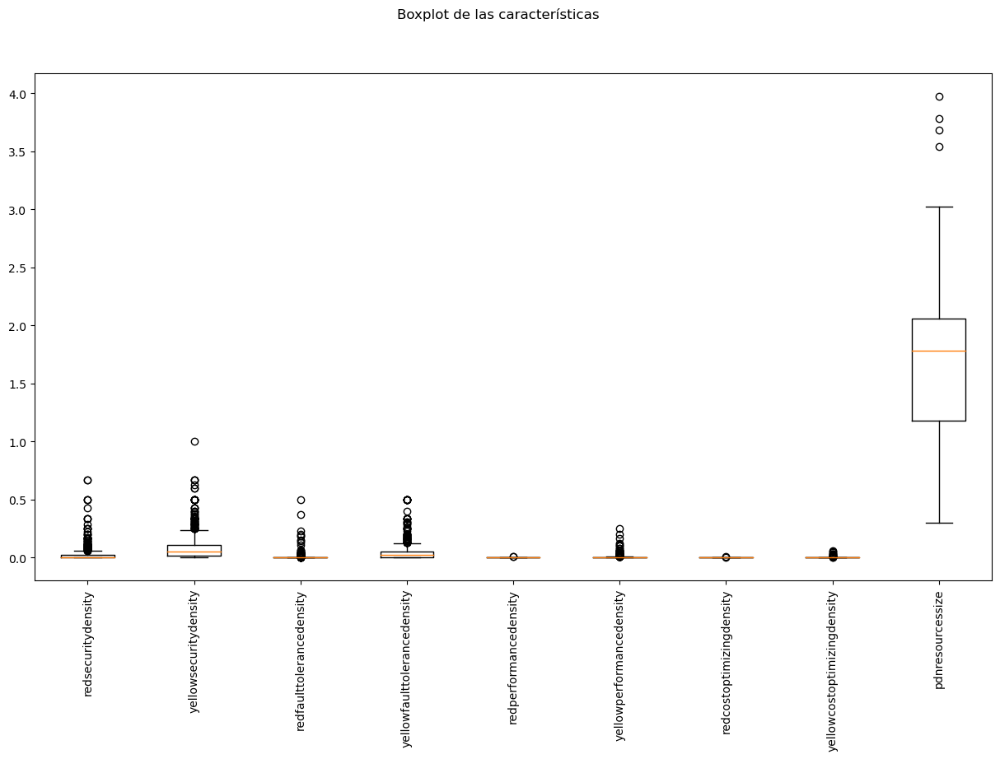

In [76]:
# boxplot for df0
fig = plt.figure(figsize=(15, 8))
fig.suptitle('Boxplot de las características')
ax = fig.add_subplot(111)
plt.boxplot(df0[features])
ax.set_xticklabels(df0[features].columns, rotation=90)
plt.show()

In [77]:
df0.describe()

,redsecuritydensity,yellowsecuritydensity,redfaulttolerancedensity,yellowfaulttolerancedensity,redperformancedensity,yellowperformancedensity,redcostoptimizingdensity,yellowcostoptimizingdensity,pdnresourcessize
count,653.000000,653.000000,653.000000,653.000000,653.000000,653.000000,653.000000,653.000000,653.000000
mean,0.027322,0.090749,0.005496,0.045643,0.000028,0.005798,0.000020,0.000544,1.622894
std,0.068309,0.120340,0.031505,0.078281,0.000501,0.019052,0.000437,0.004374,0.669225
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.301000
25%,0.000000,0.015000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.176000
50%,0.000000,0.053000,0.000000,0.021000,0.000000,0.000000,0.000000,0.000000,1.785000
75%,0.023000,0.108000,0.000000,0.051000,0.000000,0.003000,0.000000,0.000000,2.057000
max,0.667000,1.000000,0.500000,0.500000,0.010000,0.250000,0.011000,0.061000,3.972000


c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


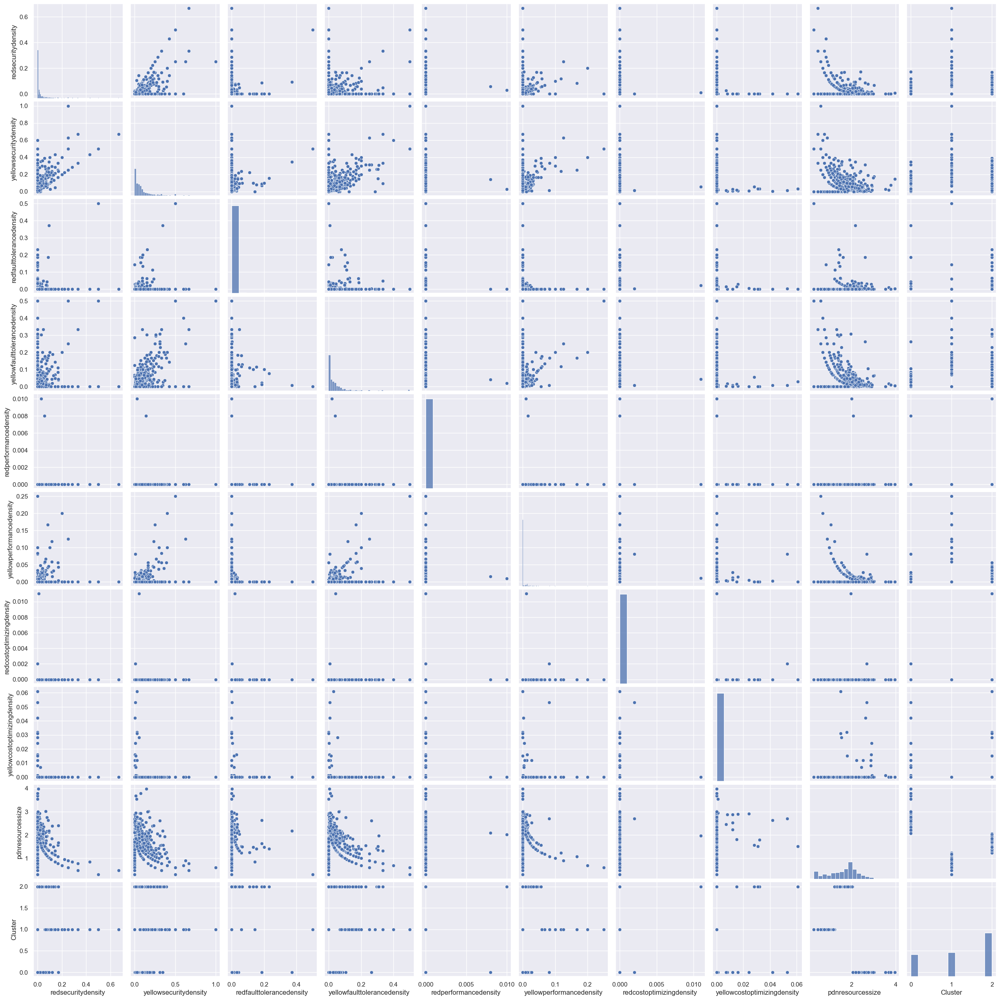

In [108]:
sns.pairplot(df0)

In [158]:
# remove rows with values = 0
df0 = df0.drop('Cluster', axis=1)


In [159]:
df0.describe()

,redsecuritydensity,yellowsecuritydensity,redfaulttolerancedensity,yellowfaulttolerancedensity,redperformancedensity,yellowperformancedensity,redcostoptimizingdensity,yellowcostoptimizingdensity,pdnresourcessize
count,554.000000,554.000000,554.000000,554.000000,554.000000,554.000000,554.000000,554.000000,554.000000
mean,0.032204,0.106966,0.006478,0.053800,0.000032,0.006834,0.000023,0.000641,1.786236
std,0.073102,0.123841,0.034115,0.082373,0.000544,0.020515,0.000475,0.004743,0.564769
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.301000
25%,0.000000,0.032000,0.000000,0.008250,0.000000,0.000000,0.000000,0.000000,1.462000
50%,0.011000,0.066000,0.000000,0.028000,0.000000,0.000000,0.000000,0.000000,1.863000
75%,0.029000,0.129750,0.000000,0.063000,0.000000,0.007000,0.000000,0.000000,2.114500
max,0.667000,1.000000,0.500000,0.500000,0.010000,0.250000,0.011000,0.061000,3.972000


Vamos a remover los checks iguales a cero en todas las aplicaciones. Son aplicaciones en excelente estado de salud que no son objeto de análisis para la solución.

In [133]:
df0 = df0.iloc[~(df0[features]==0).all(axis=1).values,:]

La normalización mejora notablemente la clusterización, se aplica para la variable pdnrsourcessize

In [161]:
features = df0.columns.to_list()
features.remove('applicationcode')
features

['redsecuritydensity',
 'yellowsecuritydensity',
 'redfaulttolerancedensity',
 'yellowfaulttolerancedensity',
 'redperformancedensity',
 'yellowperformancedensity',
 'redcostoptimizingdensity',
 'yellowcostoptimizingdensity',
 'pdnresourcessize']

In [162]:
# min max scaler
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df0_scaled = scaler.fit_transform(df0[features])
df0_scaled = pd.DataFrame(df0_scaled, columns=df0[features].columns, index=df0.index)
df0_scaled = pd.concat([df0['applicationcode'], df0_scaled], axis=1)


In [163]:
df0_scaled.describe()

,redsecuritydensity,yellowsecuritydensity,redfaulttolerancedensity,yellowfaulttolerancedensity,redperformancedensity,yellowperformancedensity,redcostoptimizingdensity,yellowcostoptimizingdensity,pdnresourcessize
count,554.000000,554.000000,554.000000,554.000000,554.000000,554.000000,554.000000,554.000000,554.000000
mean,0.048282,0.106966,0.012957,0.107599,0.003249,0.027336,0.002133,0.010505,0.404586
std,0.109598,0.123841,0.068231,0.164746,0.054361,0.082059,0.043169,0.077752,0.153846
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.032000,0.000000,0.016500,0.000000,0.000000,0.000000,0.000000,0.316263
50%,0.016492,0.066000,0.000000,0.056000,0.000000,0.000000,0.000000,0.000000,0.425497
75%,0.043478,0.129750,0.000000,0.126000,0.000000,0.028000,0.000000,0.000000,0.494007
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Probando Kmeans, con 3 clusters


In [164]:
# run kmeans with 3 clusters
kmeans = KMeans(n_clusters=3, random_state=42)
df0_scaled['Cluster'] = kmeans.fit_predict(df0_scaled.drop(columns=['applicationcode']))


c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


In [165]:
df0_scaled['Cluster'].value_counts()

1    392
0    126
2     36
Name: Cluster, dtype: int64

c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


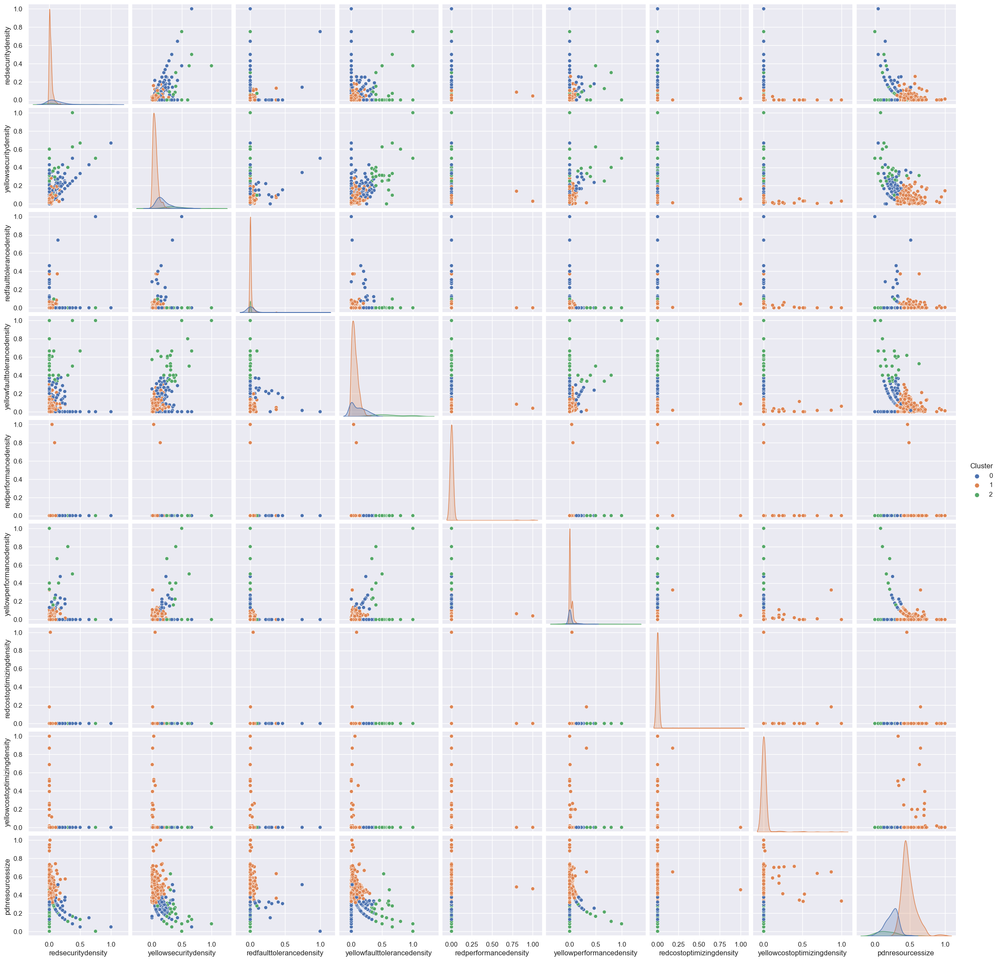

In [166]:
# Gráfica de dispersión
sns.pairplot(df0_scaled, hue="Cluster", palette="deep")
plt.show()

<Axes: xlabel='yellowfaulttolerancedensity', ylabel='yellowsecuritydensity'>

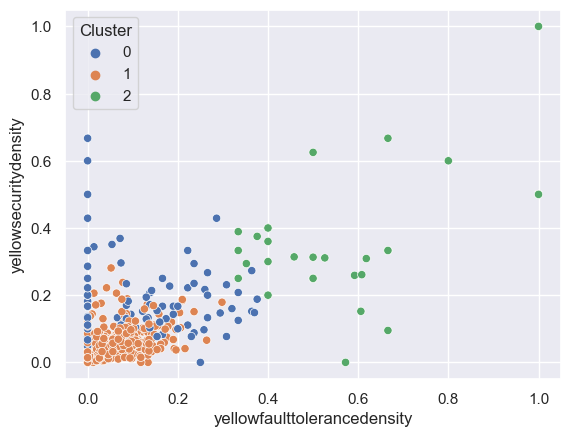

In [167]:
# Gráfica de dispersión
sns.set_theme(style="darkgrid")
sns.scatterplot(data=df0_scaled, x="yellowfaulttolerancedensity", y="yellowsecuritydensity", hue="Cluster", palette="deep")


### K = 5 clusters
K=5, normalización de la variable pdnresourcessize, sin apps con 0 checks en todos los pilares.

In [56]:
df0_scaled = pd.read_csv('data/fact_application_v2_preprocessed.csv')

In [57]:
df0_scaled.describe()

,redsecuritydensity,yellowsecuritydensity,redfaulttolerancedensity,yellowfaulttolerancedensity,redperformancedensity,yellowperformancedensity,redcostoptimizingdensity,yellowcostoptimizingdensity,pdnresourcessize
count,554.000000,554.000000,554.000000,554.000000,554.000000,554.000000,554.000000,554.000000,554.000000
mean,0.048282,0.106966,0.012957,0.107599,0.003249,0.027336,0.002133,0.010505,0.404586
std,0.109598,0.123841,0.068231,0.164746,0.054361,0.082059,0.043169,0.077752,0.153846
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.032000,0.000000,0.016500,0.000000,0.000000,0.000000,0.000000,0.316263
50%,0.016492,0.066000,0.000000,0.056000,0.000000,0.000000,0.000000,0.000000,0.425497
75%,0.043478,0.129750,0.000000,0.126000,0.000000,0.028000,0.000000,0.000000,0.494007
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [58]:
kmeans = KMeans(n_clusters=5, random_state=42)
df0_scaled['Cluster'] = kmeans.fit_predict(df0_scaled.drop(columns=['applicationcode']))

df0_scaled['Cluster'].value_counts()

c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


3    359
0    135
4     40
1     11
2      9
Name: Cluster, dtype: int64

c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


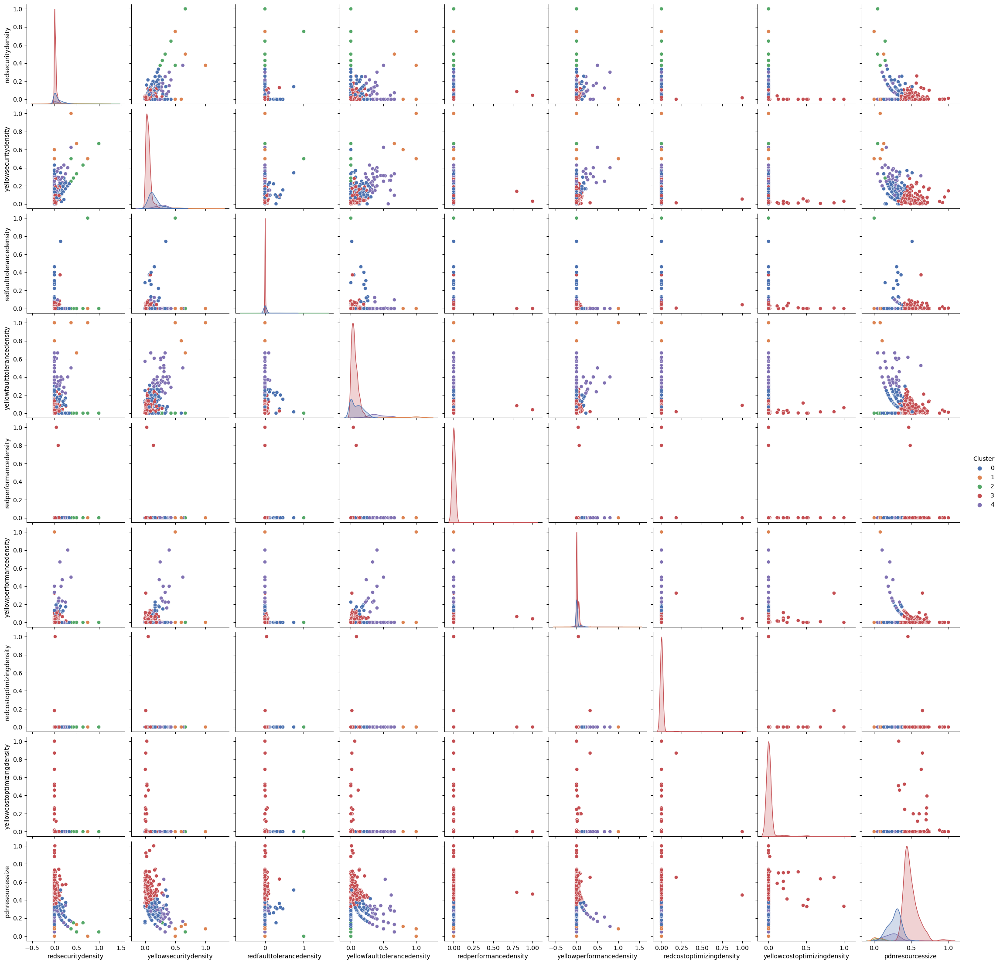

In [59]:
sns.pairplot(df0_scaled, hue="Cluster", palette="deep")

<Axes: xlabel='pdnresourcessize', ylabel='yellowcostoptimizingdensity'>

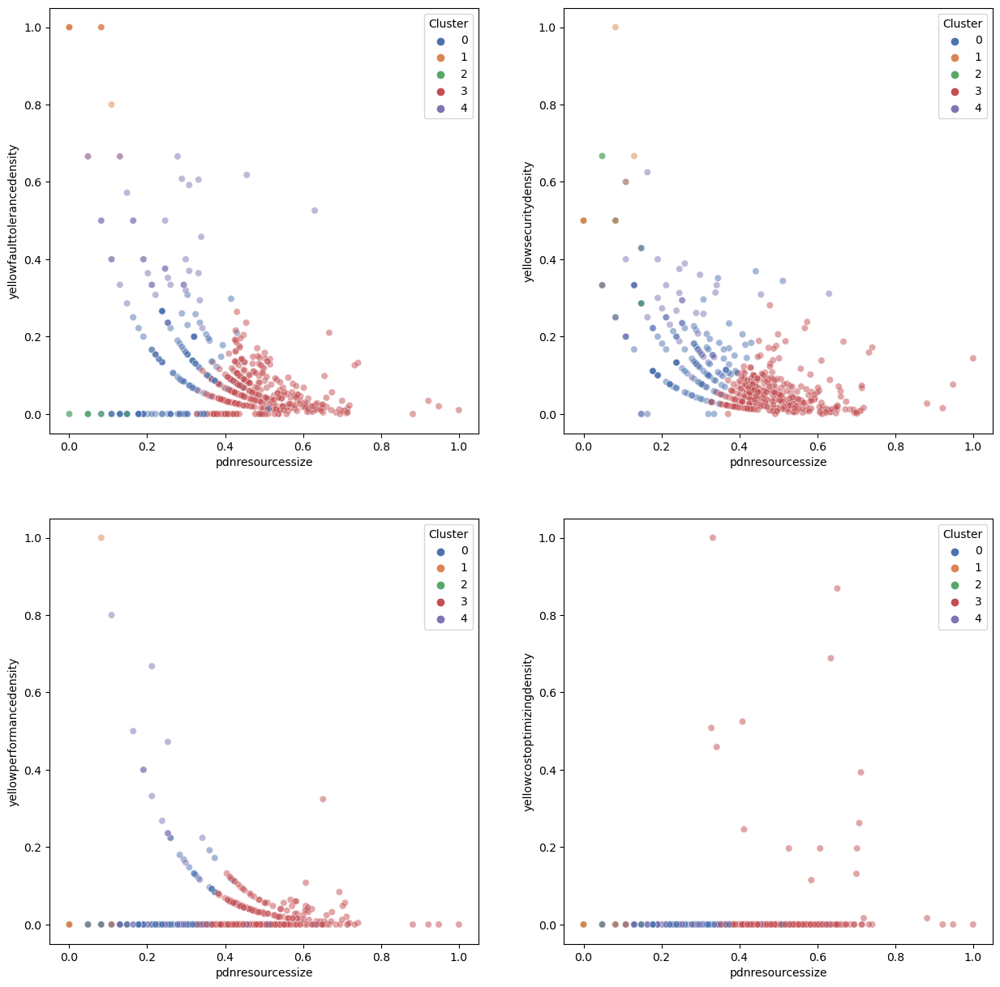

In [60]:
# scatter plot in subplots
fig, axs = plt.subplots(2, 2, figsize=(15, 15))
sns.scatterplot(data=df0_scaled, x="pdnresourcessize", y="yellowfaulttolerancedensity", hue="Cluster", palette="deep", ax=axs[0, 0], alpha=0.5)
sns.scatterplot(data=df0_scaled, x="pdnresourcessize", y="yellowsecuritydensity", hue="Cluster", palette="deep", ax=axs[0, 1], alpha=0.5)
sns.scatterplot(data=df0_scaled, x="pdnresourcessize", y="yellowperformancedensity", hue="Cluster", palette="deep", ax=axs[1, 0], alpha=0.5)
sns.scatterplot(data=df0_scaled, x="pdnresourcessize", y="yellowcostoptimizingdensity", hue="Cluster", palette="deep", ax=axs[1, 1], alpha=0.5)


En general hay unos grupos interesantes. El grupo rojo puede describirse como uno de aplicaciones con gran tamaño, y densidad de checks de costoptimizing. El grupo naranja por otro lado muestra en general aplicaciones con alta densidad en el resto de pilares. 

## Metodo de Silueta

c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


For n_clusters = 2, the average silhouette_score is : 0.8615615093369953


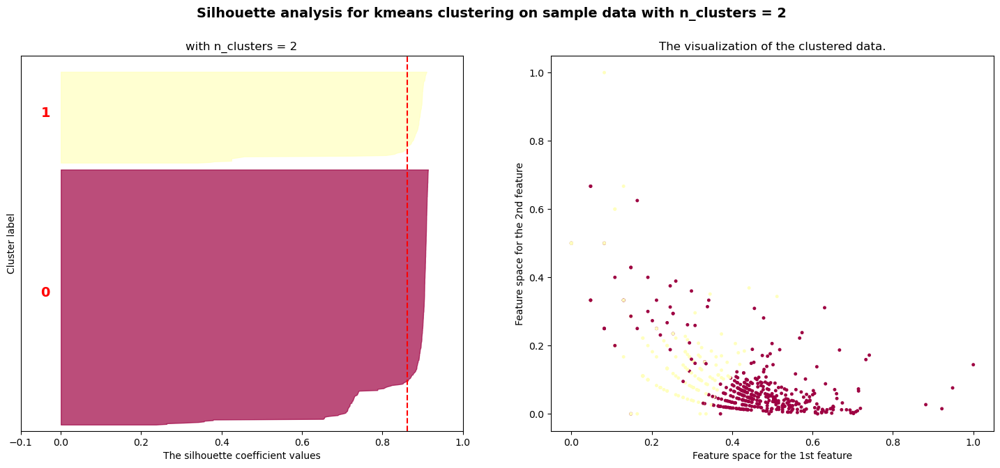

c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


For n_clusters = 3, the average silhouette_score is : 0.807206341420873


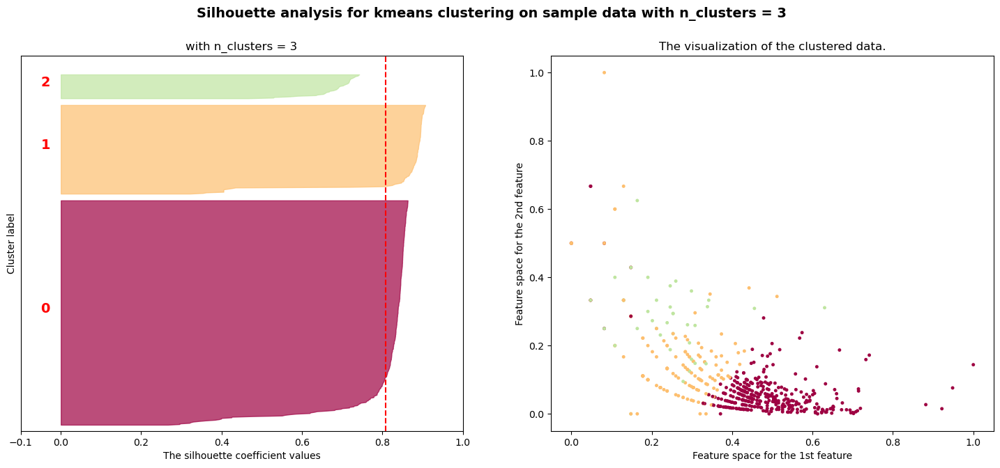

c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


For n_clusters = 4, the average silhouette_score is : 0.811128016244147


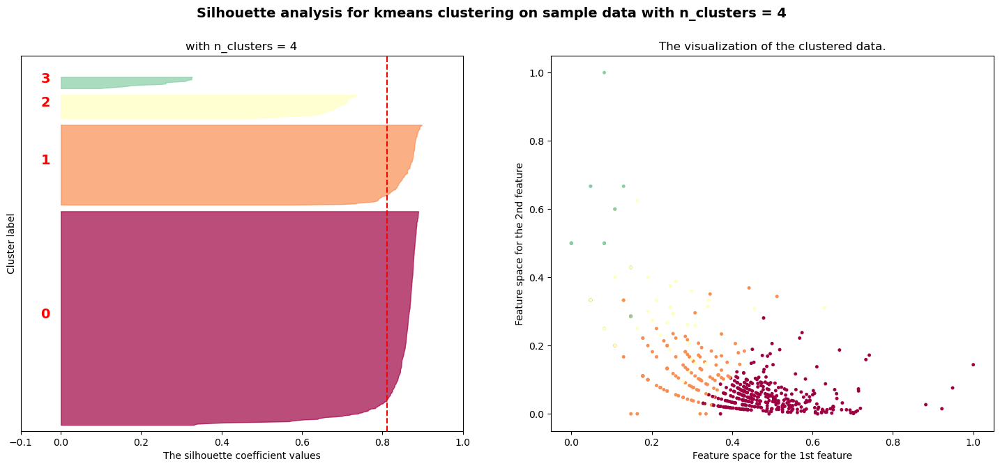

c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


For n_clusters = 5, the average silhouette_score is : 0.8168117919491342


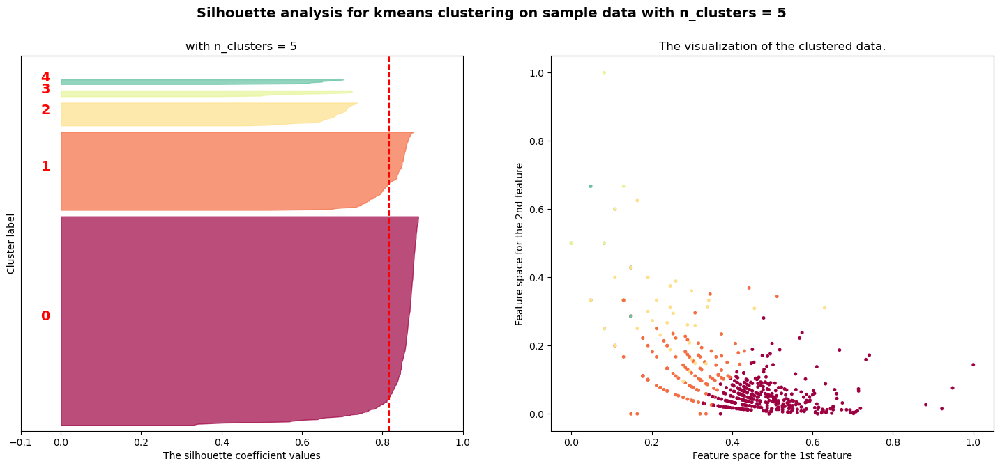

In [62]:
# silhouette score for kmeans
## apply silhouette score
from sklearn.metrics import silhouette_samples, silhouette_score
df0 = df0_scaled.copy()
for K in range(2,6):
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(df0) + (K + 1) * 15])

    model = KMeans(n_clusters=K, random_state=0)
    model.fit(df0.drop(columns=['applicationcode']))
    y_spectral = model.labels_

    silhouette_avg = silhouette_score(df0.drop(columns=['applicationcode']), y_spectral)
    print(f"For n_clusters = {K}, the average silhouette_score is : {silhouette_avg}")

    sample_silhouette_values = silhouette_samples(df0.drop(columns=['applicationcode']), y_spectral)

    y_lower = 10
    for i in range(K):
        ith_cluster_silhouette_values = sample_silhouette_values[y_spectral == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = plt.colormaps.get_cmap("Spectral")(float(i) / K)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
            )

        ax1.text(
            -0.05,
            y_lower + 0.5 * size_cluster_i,
            str(i),
            color="red",
            fontweight="bold",
            fontsize=14,
            )

        y_lower = y_upper + 10
    
    
    ax1.set_title(f"with n_clusters = {K}")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    colors = plt.colormaps.get_cmap("Spectral")(y_spectral.astype(float) / K)
    ax2.scatter(df0['pdnresourcessize'], df0['yellowsecuritydensity'], marker='.', s=50, lw=0, alpha=1, c=colors, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")
    
    plt.suptitle(
        (
            f"Silhouette analysis for kmeans clustering on sample data "
            f"with n_clusters = {K}"
        ),
        fontsize=14,
        fontweight="bold",
        )

    # insert
    plt.show()

## Solo pilar Security
Los ceros en la densidad pueden generar mucho ruido, nuevamente se va a hacer un filtro para dejar unicamente las aplicaciones con checks de seguridad.

In [84]:
df_sec = df.filter(regex='applicationcode|pdnresourcessize|security')
df_sec.info()


(653, 4)


In [87]:
df_sec = df_sec[df_sec['yellowsecuritydensity'] != 0]
df_sec = df_sec[df_sec['redsecuritydensity'] != 0]
df_sec.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 322 entries, 0 to 652
Data columns (total 4 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   applicationcode        322 non-null    object 
 1   redsecuritydensity     322 non-null    float64
 2   yellowsecuritydensity  322 non-null    float64
 3   pdnresourcessize       322 non-null    float64
dtypes: float64(3), object(1)
memory usage: 12.6+ KB


Quedan solo 322 entradas, y 4 variables, vamos a ver como responde en este caso

c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


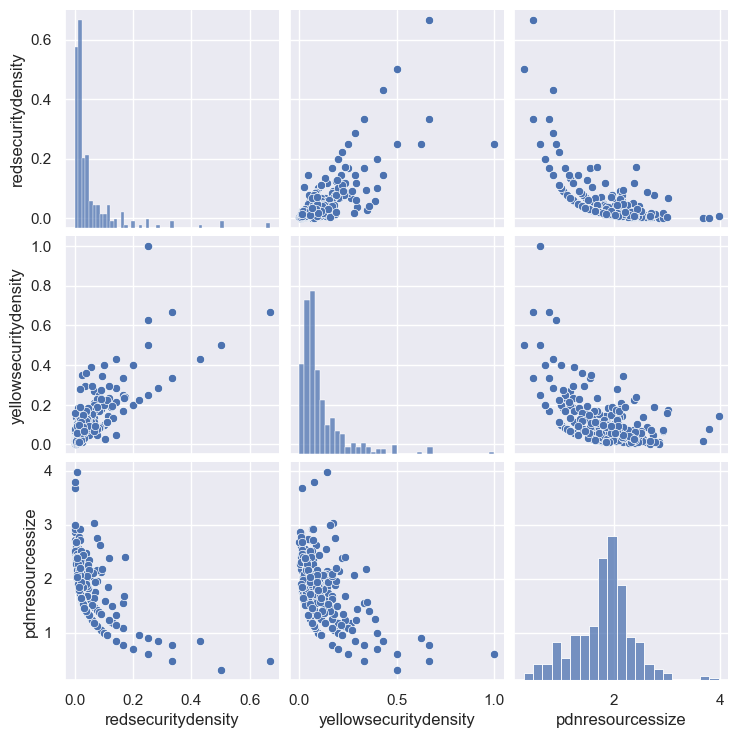

In [91]:
# pairplot
sns.pairplot(df_sec)

Las aplicaciones con densidad de checks amarillos más baja son las que más recursos desplegados tienen. Hay una menor densidad entre más recursos tiene una aplicación, una aplicación con poquitos recursos, en generar tienen baja densidad de checks en amarillo y rojo. Ahora, las aplicación con pocos recursos, y alta densidad de checks, son aplicaciones susceptibles a ser revisadas detenidamente dado que pueden estar generando brechas de seguridad grandes para la organización.

In [92]:
# k means de df_sec
kmeans = KMeans(n_clusters=3, random_state=42)
df_sec['Cluster'] = kmeans.fit_predict(df_sec.drop(columns=['applicationcode']))

df_sec['Cluster'].value_counts()

c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


2    193
0     75
1     54
Name: Cluster, dtype: int64

c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


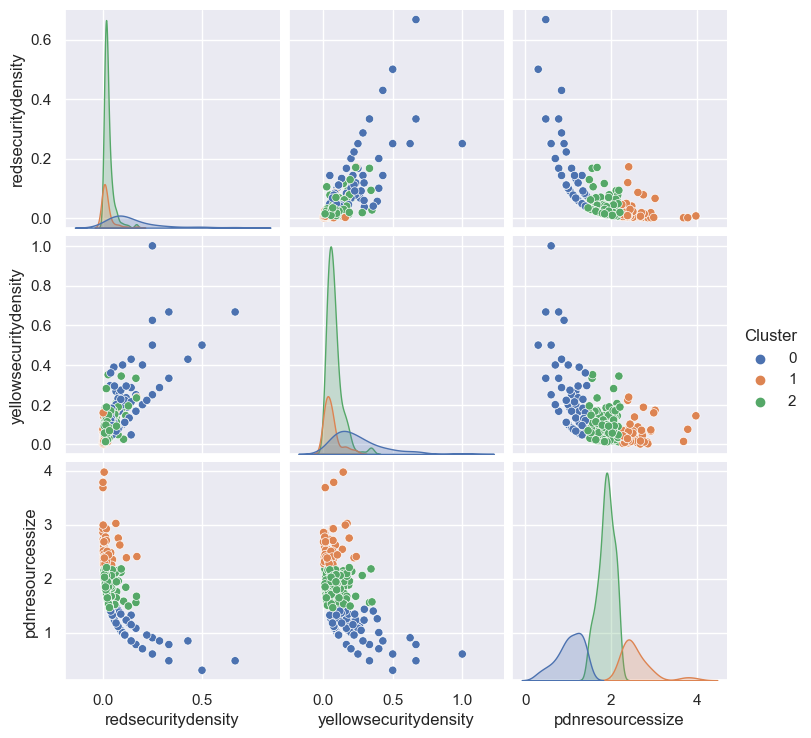

In [101]:
# Gráfica de dispersión
sns.pairplot(df_sec, hue="Cluster", palette="deep")
plt.show()

En el grupo azul se ven las aplicaciones con alta densidad de checks amarillos y rojos y poca cantidad de recursos. Este sería un grupo crítico de aplicaciones que deben ser intervenidas. El grupo verde son aplicaciones con pocos checks y un tamaño de aplicación mediano, por último el grupo naranja son aplicaciones con pocos checks y un tamaño de aplicación grande.

In [102]:
# normalize pdnresourcessize
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df_sec_scaled = scaler.fit_transform(df_sec.drop(columns=['applicationcode']))

# index to keep the index of df_sec
df_sec_scaled = pd.DataFrame(df_sec_scaled, columns=df_sec.drop(columns=['applicationcode']).columns, index=df_sec.index)

#concat df_sec_scaled with applicationcode
df_sec_scaled = pd.concat([df_sec['applicationcode'], df_sec_scaled], axis=1)

df_sec_scaled.describe()


,redsecuritydensity,yellowsecuritydensity,pdnresourcessize,Cluster
count,322.000000,322.000000,322.000000,322.000000
mean,0.081515,0.112240,0.408314,0.683230
std,0.133688,0.123429,0.151186,0.418384
min,0.000000,0.000000,0.000000,0.000000
25%,0.019520,0.043086,0.325116,0.500000
50%,0.033033,0.071643,0.425497,1.000000
75%,0.082583,0.135020,0.488968,1.000000
max,1.000000,1.000000,1.000000,1.000000


In [104]:
# remove column Cluster
df_sec_scaled = df_sec_scaled.drop(columns=['Cluster'])
df_sec_scaled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 322 entries, 0 to 652
Data columns (total 4 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   applicationcode        322 non-null    object 
 1   redsecuritydensity     322 non-null    float64
 2   yellowsecuritydensity  322 non-null    float64
 3   pdnresourcessize       322 non-null    float64
dtypes: float64(3), object(1)
memory usage: 12.6+ KB


In [106]:
kmeans = KMeans(n_clusters=3, random_state=42)

df_sec_scaled['Cluster'] = kmeans.fit_predict(df_sec_scaled[df_sec_scaled.columns.to_list()[1:]])

df_sec_scaled['Cluster'].value_counts()

c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


1    236
0     74
2     12
Name: Cluster, dtype: int64

c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


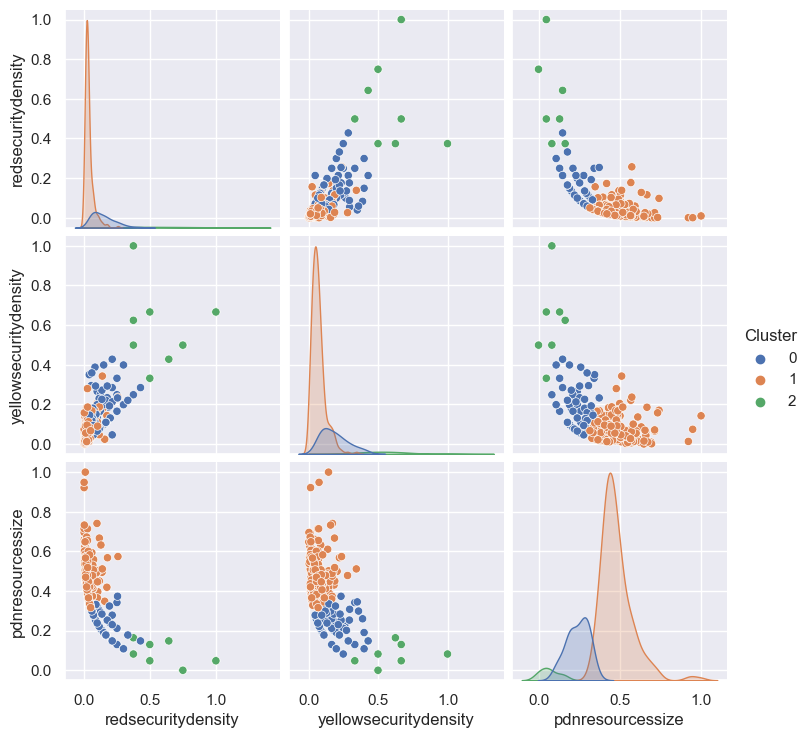

In [107]:
# pairplot
sns.pairplot(df_sec_scaled, hue="Cluster", palette="deep")
plt.show()

Con la normalización se encuentran mejores resultados, porque logra distinguir las aplicaciones con altas densidades de checks, incluso separa el grupo de los que tienen baja densidad (matriz entre yellowsecuritydensity y redsecuritydensity).

## DBSCAN

In [296]:
df = pd.read_csv('data/fact_application_v2_preprocessed.csv')

In [297]:
# apply dbscan
from sklearn.cluster import DBSCAN

# Compute DBSCAN
db = DBSCAN(eps=0.2, min_samples=11).fit(df.drop(columns=['applicationcode']))
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_
df0 = df.copy()
df0['Cluster'] = labels
df0['Cluster'].value_counts()

 0    501
-1     53
Name: Cluster, dtype: int64

El -1 en los labels corresponde al ruido. El ruido son esos datapoints que no pertenecen a ningun componente. El ruido puede interpretarse como esas aplicaciones atípicas que necesitan un tratamiento especial, cuando antes.

c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


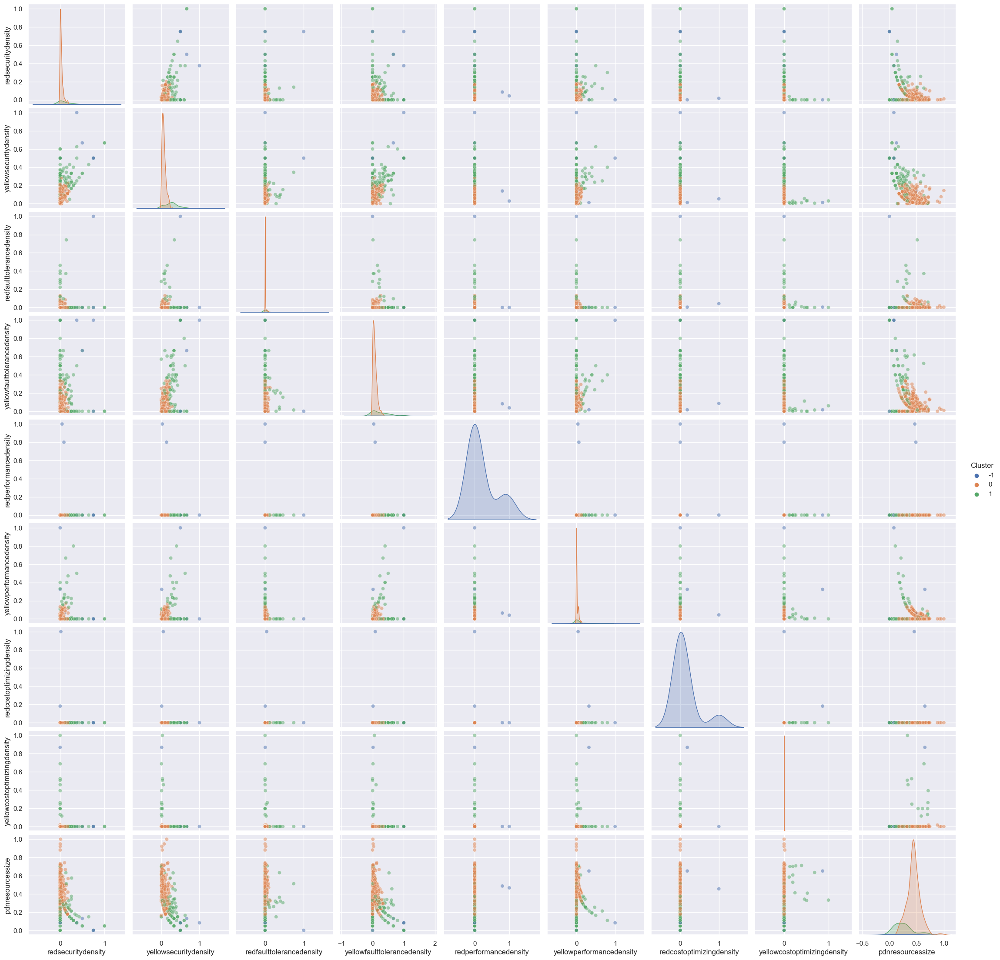

In [136]:
# pairplot
sns.set_theme(style="darkgrid")
sns.pairplot(df0, hue="Cluster", palette="deep",  plot_kws={'alpha': 0.5})

In [298]:
# calculate the mean of every cluster
df0.groupby('Cluster').mean().T

C:\Users\fede_\AppData\Local\Temp\ipykernel_13116\3102418959.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df0.groupby('Cluster').mean().T


Cluster,-1,0
redsecuritydensity,0.159515,0.036515
yellowsecuritydensity,0.308340,0.085663
redfaulttolerancedensity,0.071887,0.006723
yellowfaulttolerancedensity,0.340302,0.082982
redperformancedensity,0.033962,0.000000
yellowperformancedensity,0.102943,0.019337
redcostoptimizingdensity,0.022298,0.000000
yellowcostoptimizingdensity,0.083823,0.002749
pdnresourcessize,0.279128,0.417858


In [ ]:
df0_crit = df0[df0['Cluster'] == -1]
df0_crit.shape

(53, 11)

c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


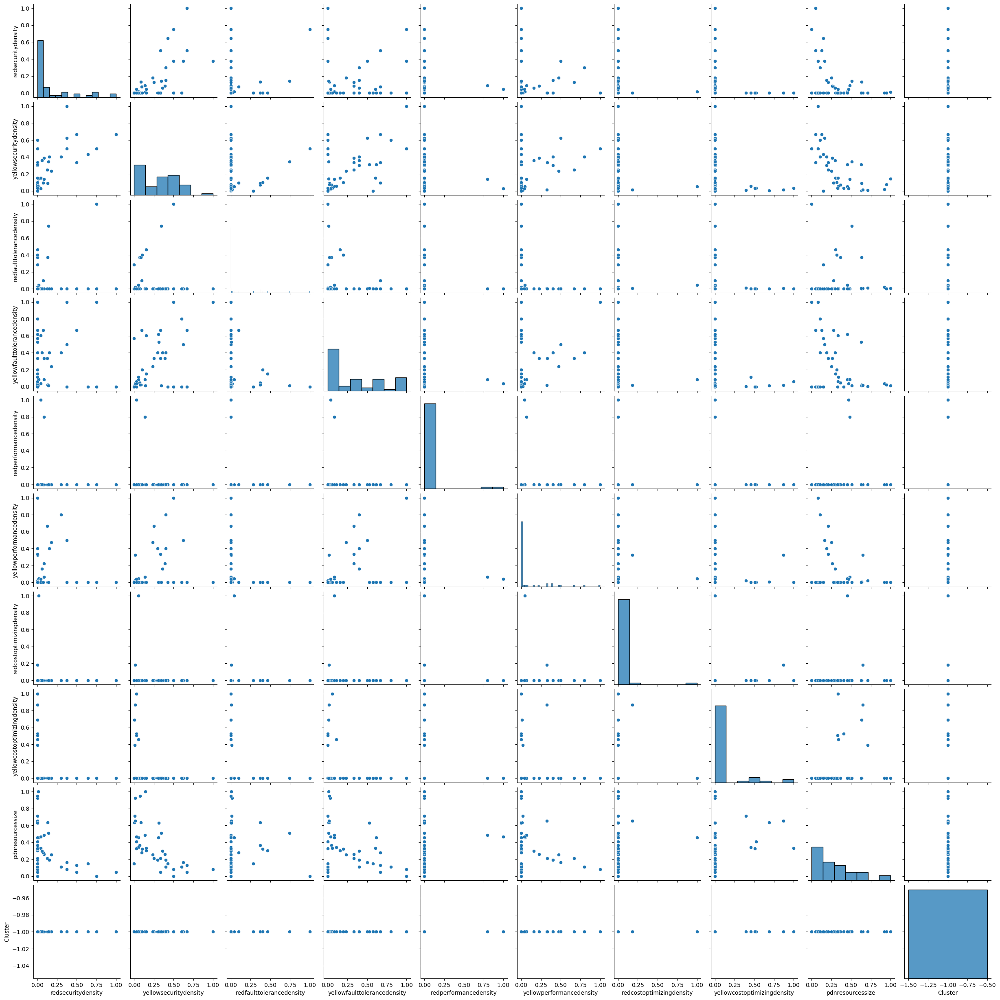

In [ ]:
# pairplot of df0_crit
sns.pairplot(df0_crit)

In [ ]:
df0[df0['Cluster'] == 0].describe()

,redsecuritydensity,yellowsecuritydensity,redfaulttolerancedensity,yellowfaulttolerancedensity,redperformancedensity,yellowperformancedensity,redcostoptimizingdensity,yellowcostoptimizingdensity,pdnresourcessize,Cluster,avg_density
count,501.000000,501.000000,501.000000,501.000000,501.0,501.000000,501.0,501.000000,501.000000,501.0,0.0
mean,0.036515,0.085663,0.006723,0.082982,0.0,0.019337,0.0,0.002749,0.417858,0.0,NaN
std,0.063622,0.079721,0.026488,0.098236,0.0,0.039302,0.0,0.023345,0.131905,0.0,NaN
min,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.047943,0.0,NaN
25%,0.000000,0.032000,0.000000,0.018000,0.0,0.000000,0.0,0.000000,0.335059,0.0,NaN
50%,0.016492,0.060000,0.000000,0.054000,0.0,0.000000,0.0,0.000000,0.428766,0.0,NaN
75%,0.038981,0.111000,0.000000,0.106000,0.0,0.028000,0.0,0.000000,0.496595,0.0,NaN
max,0.499250,0.429000,0.308000,0.666000,0.0,0.268000,0.0,0.262295,0.881776,0.0,NaN


In [86]:
 df0.filter(regex='yellow')

,yellowsecuritydensity,yellowfaulttolerancedensity,yellowperformancedensity,yellowcostoptimizingdensity
0,0.077,0.000,0.000,0.0
1,0.058,0.058,0.000,0.0
2,0.012,0.004,0.000,0.0
3,0.026,0.102,0.000,0.0
4,0.016,0.000,0.000,0.0
...,...,...,...,...
549,0.092,0.022,0.000,0.0
550,0.032,0.032,0.000,0.0
551,0.167,0.200,0.132,0.0
552,0.013,0.000,0.000,0.0


<Axes: >

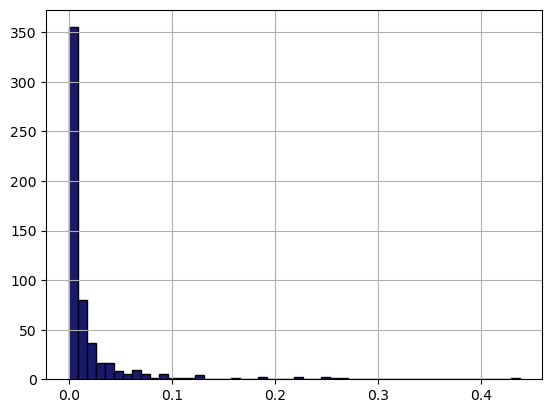

In [88]:
# column with avg of all density columns
df0['avg_red_density'] = df0.filter(regex='red').mean(axis=1)
df0['avg_yellow_density'] = df0.filter(regex='yellow').mean(axis=1)
df0['avg_red_density'].hist(bins=50, facecolor='midnightblue', edgecolor='black')

<Axes: >

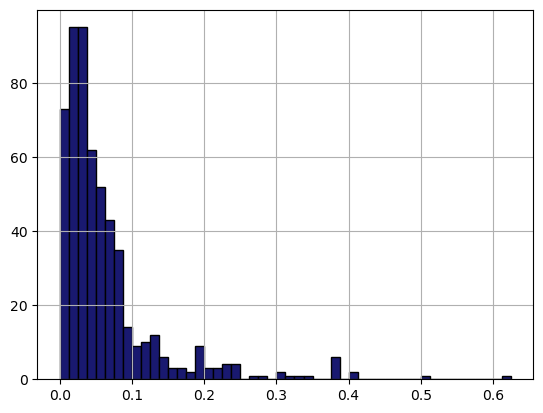

In [89]:
df0['avg_yellow_density'].hist(bins=50, facecolor='midnightblue', edgecolor='black')

In [73]:
df0['avg_density'].count()

554

In [74]:
df0_crit.describe()

,redsecuritydensity,yellowsecuritydensity,redfaulttolerancedensity,yellowfaulttolerancedensity,redperformancedensity,yellowperformancedensity,redcostoptimizingdensity,yellowcostoptimizingdensity,pdnresourcessize,Cluster,avg_density
count,53.000000,53.000000,53.000000,53.000000,53.000000,53.000000,53.000000,53.000000,53.000000,53.0,53.000000
mean,0.159515,0.308340,0.071887,0.340302,0.033962,0.102943,0.022298,0.083823,0.279128,-1.0,0.140384
std,0.273634,0.237242,0.197099,0.367171,0.174249,0.224312,0.139139,0.230198,0.258206,0.0,0.072061
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.0,0.008562
25%,0.000000,0.076000,0.000000,0.014000,0.000000,0.000000,0.000000,0.000000,0.081994,-1.0,0.087500
50%,0.001499,0.333000,0.000000,0.200000,0.000000,0.000000,0.000000,0.000000,0.211931,-1.0,0.136250
75%,0.149925,0.500000,0.004000,0.618000,0.000000,0.040000,0.000000,0.000000,0.408063,-1.0,0.187500
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,-1.0,0.312500


c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


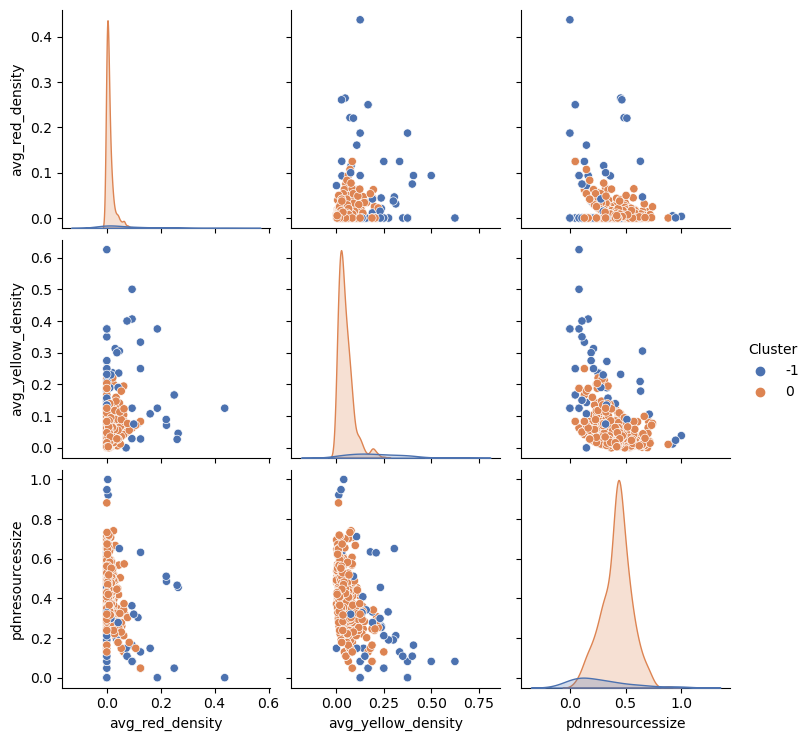

In [90]:
df0[['avg_red_density', 'avg_yellow_density', 'pdnresourcessize']].describe()

# create pairplot with above dataframe
sns.pairplot(df0[['avg_red_density', 'avg_yellow_density','pdnresourcessize', 'Cluster']], hue="Cluster", palette="deep")

El promedio de densidad de checks para todos los pilares y el tamaño de la aplicación separada por cada uno de los clusters. Las aplicaciones con densidad promedio elevada son marcadas en un grupo y aquellas de baja densidad en otro grupo.. algunos data points quedan por fuera.
Cuando se hace la separación del promedio por para cada uno de los niveles de criticidad, se encuentra una buena clusterización para las aplicación con densidad promedio elevada para los dos niveles. 

Ahora vamos a probar DBScan pero con las 99 muestras que no tenian checks en producción

In [100]:
apps_pdn = pd.read_csv('data/fact_application_v2.csv')

,applicationcode,redsecuritydensity,yellowsecuritydensity,redfaulttolerancedensity,yellowfaulttolerancedensity,redperformancedensity,yellowperformancedensity,redcostoptimizingdensity,yellowcostoptimizingdensity,pdnresourcessize
0,app00035,0.038,0.077,0.000,0.000,0.0,0.000,0.0,0.0,1.415
1,app00032,0.014,0.058,0.000,0.029,0.0,0.000,0.0,0.0,1.839
2,app00036,0.000,0.012,0.000,0.002,0.0,0.000,0.0,0.0,2.814
3,app00031,0.000,0.026,0.000,0.051,0.0,0.000,0.0,0.0,1.591
4,app00033,0.016,0.016,0.000,0.000,0.0,0.000,0.0,0.0,1.806
...,...,...,...,...,...,...,...,...,...,...
648,app00882,0.069,0.092,0.023,0.011,0.0,0.000,0.0,0.0,1.940
649,app00069,0.000,0.032,0.000,0.016,0.0,0.000,0.0,0.0,1.799
650,app00068,0.000,0.167,0.000,0.100,0.0,0.033,0.0,0.0,1.477
651,app00066,0.000,0.013,0.000,0.000,0.0,0.000,0.0,0.0,1.875


In [101]:
# apply dbscan
from sklearn.cluster import DBSCAN

# Compute DBSCAN
db = DBSCAN(eps=0.2, min_samples=11).fit(apps_pdn.drop(columns=['applicationcode']))
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_
apps_pdn['Cluster'] = labels

apps_pdn['Cluster'].value_counts()

 0    613
-1     40
Name: Cluster, dtype: int64

c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


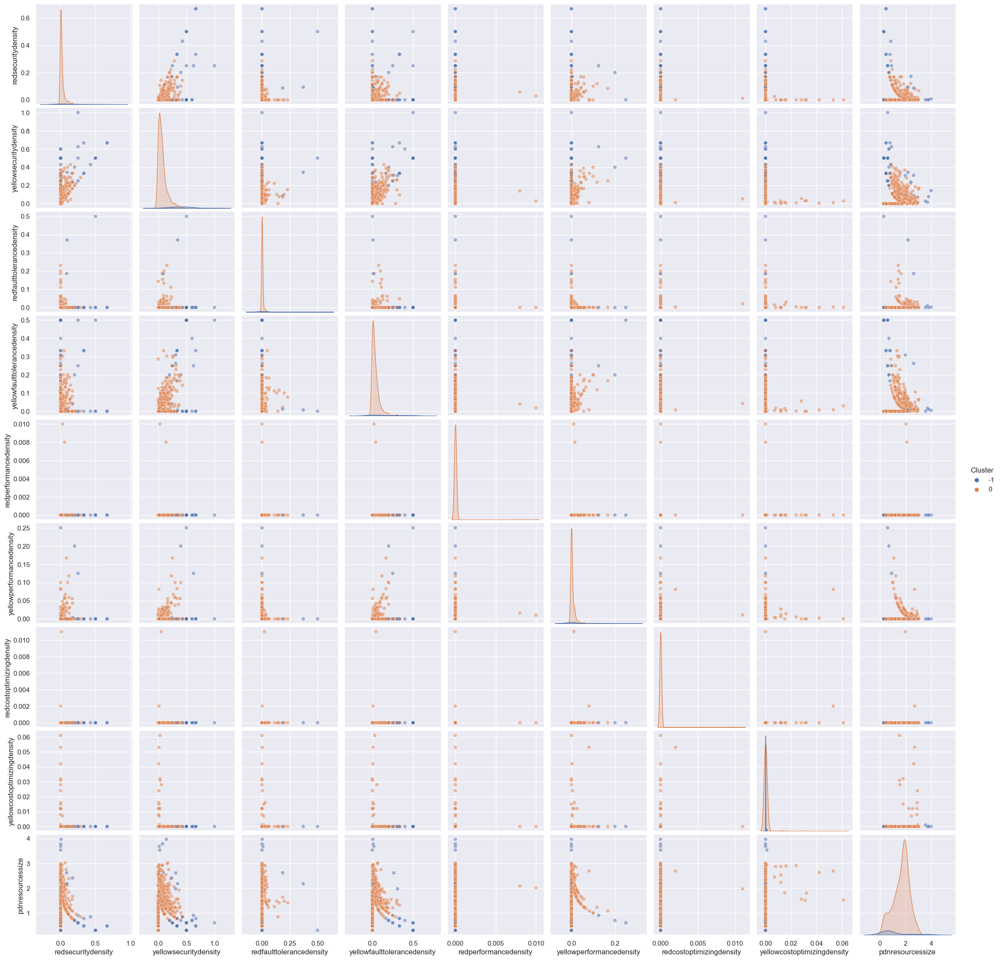

In [102]:
# pair plot
sns.set_theme(style="darkgrid")
sns.pairplot(apps_pdn, hue="Cluster", palette="deep",  plot_kws={'alpha': 0.5})

No se generan buenos resultados esta vez. Igual quedan 2 grupos. El grupo con mayor densidad de checks disminuye en su volumen. Y las apps con densidad de checks elevadas en costoptimizing quedan en el grupo de las apps buenas. No hace una buena clusterización en este caso. Las aplicaciones con buen estado resultan afectar la generalización del modelo.

#### Metodo de silueta

In [142]:
np.unique(db.labels_[db.labels_ != -1])

array([0, 1, 2], dtype=int64)

In [207]:
df0 = pd.read_csv('data/fact_application_v2_preprocessed.csv')

In [153]:
np.unique(db.labels_)

array([-1,  0,  1,  2], dtype=int64)

For eps = 0.2, min_samples = 11 the average silhouette_score is : 0.7607158089623817
53
501


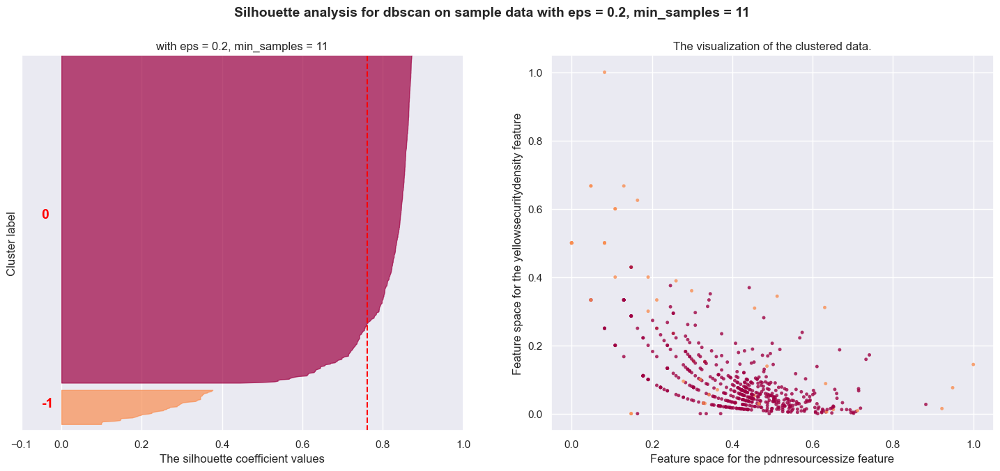

In [210]:
## apply silhouette score
from sklearn.metrics import silhouette_samples, silhouette_score


for K in [0.2]:
    for M in range(11,12):
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        ax1.set_xlim([-0.1, 1])
        ax1.set_ylim([0, len(df0) + (K + 1) * 15])

        db = DBSCAN(eps=K, min_samples=M)
        db.fit(df0.drop(columns=['applicationcode']))
        clusters = db.labels_

        silhouette_avg = silhouette_score(df0.drop(columns=['applicationcode']), clusters)
        print(f"For eps = {K}, min_samples = {M} the average silhouette_score is : {silhouette_avg}")

        sample_silhouette_values = silhouette_samples(df0.drop(columns=['applicationcode']), clusters)

        y_lower = 10
        for i in np.unique( clusters ):
            ith_cluster_silhouette_values = sample_silhouette_values[clusters == i]
            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            print(size_cluster_i)
            y_upper = y_lower + size_cluster_i

            color = plt.colormaps.get_cmap("Spectral")(abs(float(i))*0.5 / len(np.unique( clusters )))
            ax1.fill_betweenx(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_silhouette_values,
                facecolor=color,
                edgecolor=color,
                alpha=0.7,
                )

            ax1.text(
                -0.05,
                y_lower + 0.5 * size_cluster_i,
                str(i),
                color="red",
                fontweight="bold",
                fontsize=14,
                )

            y_lower = y_upper + 10
        
        
        ax1.set_title(f"with eps = {K}, min_samples = {M}")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        colors = plt.colormaps.get_cmap("Spectral")(abs(clusters.astype(float))*0.5 / len(np.unique( clusters )))
        ax2.scatter(df0['pdnresourcessize'], df0['yellowsecuritydensity'], marker='.', s=50, lw=0, alpha=0.8, c=colors, edgecolor='k')

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the pdnresourcessize feature")
        ax2.set_ylabel("Feature space for the yellowsecuritydensity feature")
        
        plt.suptitle(
            (
                f"Silhouette analysis for dbscan on sample data "
                f"with eps = {K}, min_samples = {M}"
            ),
            fontsize=14,
            fontweight="bold",
            )

        # insert
        plt.show()

El mejor resultado en la silueta se encuentra con eps = 0.2 y min_samples = 11

C:\Users\fede_\AppData\Local\Temp\ipykernel_13116\619452655.py:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df0.iloc[:, :-1].corr(), annot=True, cmap="YlGnBu")


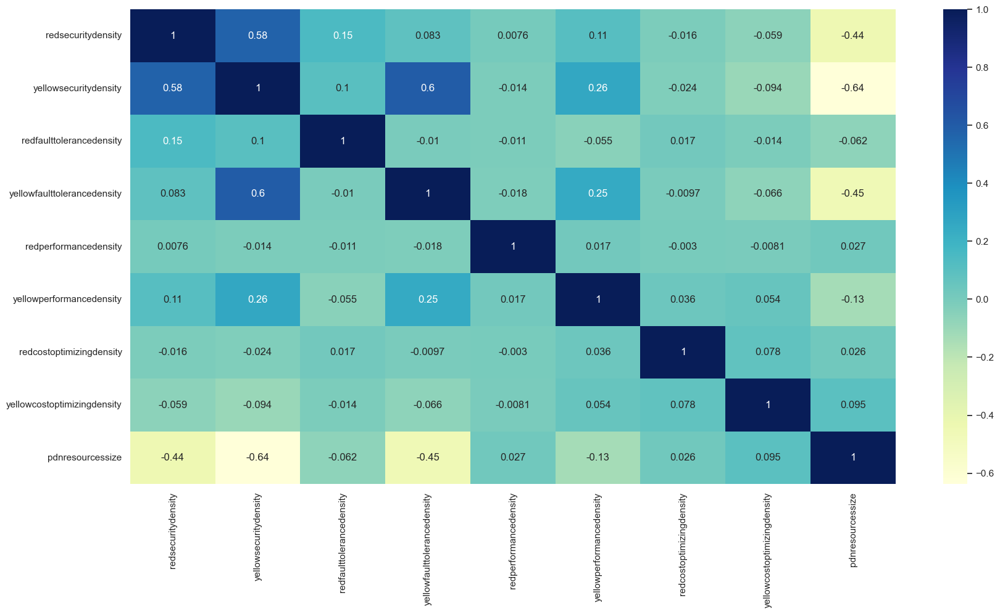

In [219]:
df0.iloc[:, :-1]

# heatmap of correlation
plt.figure(figsize=(20,10))
sns.heatmap(df0.iloc[:, :-1].corr(), annot=True, cmap="YlGnBu")
plt.show()

### Validación

In [249]:
df_test = pd.read_csv('data/fact_application_to_validation.csv')
df_test.shape

(102, 40)

In [250]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102 entries, 0 to 101
Data columns (total 40 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   application_id                      102 non-null    int64  
 1   organization_id                     102 non-null    int64  
 2   provider_id                         102 non-null    int64  
 3   snapshot_date_id                    102 non-null    int64  
 4   applicationcode                     102 non-null    object 
 5   fullresourcescount                  102 non-null    int64  
 6   devresourcescount                   102 non-null    int64  
 7   qaresourcescount                    102 non-null    int64  
 8   pdnresourcescount                   102 non-null    int64  
 9   fullaccountscount                   102 non-null    int64  
 10  devaccountscount                    102 non-null    int64  
 11  qaaccountscount                     102 non-n

In [251]:
df_test = df_test.filter(regex='pdnresourcessize|density|clasification')
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102 entries, 0 to 101
Data columns (total 10 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   redsecuritydensity           102 non-null    float64
 1   yellowsecuritydensity        102 non-null    float64
 2   redfaulttolerancedensity     102 non-null    float64
 3   yellowfaulttolerancedensity  102 non-null    float64
 4   redperformancedensity        102 non-null    float64
 5   yellowperformancedensity     102 non-null    float64
 6   redcostoptimizingdensity     102 non-null    float64
 7   yellowcostoptimizingdensity  102 non-null    float64
 8   pdnresourcessize             102 non-null    float64
 9   clasification                102 non-null    object 
dtypes: float64(9), object(1)
memory usage: 8.1+ KB


In [252]:
# change clasification column values to 0,1 and 2
df_test['clasification'] = df_test['clasification'].replace('Red', 0)
df_test['clasification'] = df_test['clasification'].replace('Yellow', 1)
df_test['clasification'] = df_test['clasification'].replace('Green', 2)


In [253]:
df_test['clasification'].value_counts()

2    68
1    24
0    10
Name: clasification, dtype: int64

c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


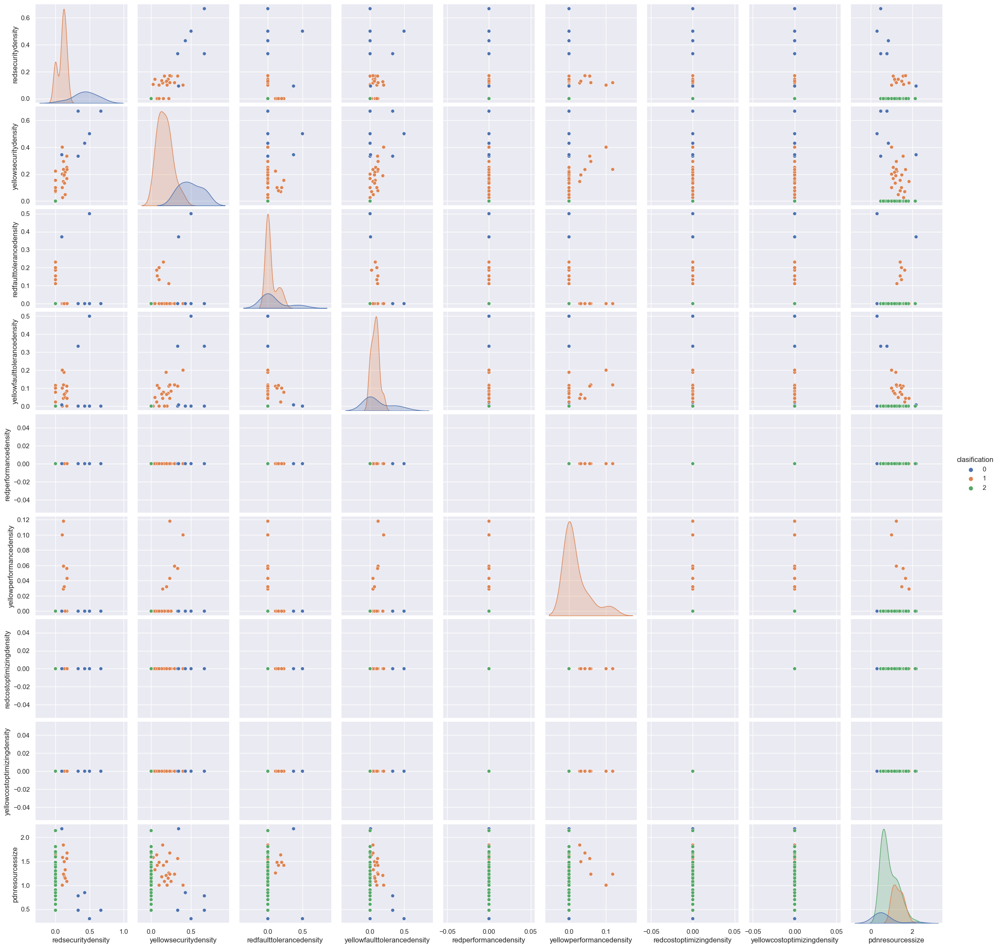

In [254]:
sns.pairplot(df_test, hue="clasification", palette="deep")

10 aplicaciones del grupo crítico, 24 grupo intermedio y el resto 68 estan en verde. Los verdes tienen toda la densidad en cero. No hay correlación del tamaño de la aplicación con la densidad.

In [255]:
df_test.describe()

,redsecuritydensity,yellowsecuritydensity,redfaulttolerancedensity,yellowfaulttolerancedensity,redperformancedensity,yellowperformancedensity,redcostoptimizingdensity,yellowcostoptimizingdensity,pdnresourcessize,clasification
count,102.000000,102.000000,102.000000,102.000000,102.0,102.000000,102.0,102.0,102.000000,102.000000
mean,0.065255,0.088471,0.018490,0.028961,0.0,0.004284,0.0,0.0,0.967971,1.568627
std,0.141999,0.163576,0.072743,0.076459,0.0,0.017906,0.0,0.0,0.432716,0.667637
min,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.301000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.602000,1.000000
50%,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.951500,2.000000
75%,0.100000,0.100000,0.000000,0.000000,0.0,0.000000,0.0,0.0,1.248750,2.000000
max,0.667000,0.667000,0.500000,0.500000,0.0,0.118000,0.0,0.0,2.179000,2.000000


In [256]:
df_test['pdnresourcessize'].values.reshape(-1,1).shape

(102, 1)

In [267]:

# normalize pdnresourcessize
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df_test_scaled = scaler.fit_transform(df_test['pdnresourcessize'].values.reshape(-1,1))
df_test_scaled = pd.DataFrame(df_test_scaled, columns=['pdnresourcessize'], index=df_test.index)
df_test_scaled = pd.concat([df_test.drop(columns=['pdnresourcessize']), df_test_scaled], axis=1)
df_test_scaled.describe()

,redsecuritydensity,yellowsecuritydensity,redfaulttolerancedensity,yellowfaulttolerancedensity,redperformancedensity,yellowperformancedensity,redcostoptimizingdensity,yellowcostoptimizingdensity,clasification,pdnresourcessize
count,102.000000,102.000000,102.000000,102.000000,102.0,102.000000,102.0,102.0,102.000000,102.000000
mean,0.065255,0.088471,0.018490,0.028961,0.0,0.004284,0.0,0.0,1.568627,0.355149
std,0.141999,0.163576,0.072743,0.076459,0.0,0.017906,0.0,0.0,0.667637,0.230413
min,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,1.000000,0.160277
50%,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,2.000000,0.346379
75%,0.100000,0.100000,0.000000,0.000000,0.0,0.000000,0.0,0.0,2.000000,0.504659
max,0.667000,0.667000,0.500000,0.500000,0.0,0.118000,0.0,0.0,2.000000,1.000000


Se normaliza el campo de pdnresourcessize para que los datos de validación esten en el mismo rango de los datos de la primera clusterización.

In [268]:
# apply dbscan
from sklearn.cluster import DBSCAN

# Compute DBSCAN
db = DBSCAN(eps=0.2, min_samples=11).fit(df_test_scaled.drop(columns=['clasification']))
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_
df_test_scaled['Cluster'] = labels

df_test_scaled['Cluster'].value_counts()

 0    90
-1    12
Name: Cluster, dtype: int64

In [269]:
df_test_scaled[['Cluster', 'clasification']]

,Cluster,clasification
0,0,1
1,0,1
2,0,1
3,0,1
4,0,1
...,...,...
97,0,2
98,0,2
99,0,2
100,0,2


In [270]:
df_test_scaled

,redsecuritydensity,yellowsecuritydensity,redfaulttolerancedensity,yellowfaulttolerancedensity,redperformancedensity,yellowperformancedensity,redcostoptimizingdensity,yellowcostoptimizingdensity,clasification,pdnresourcessize,Cluster
0,0.100,0.100,0.000,0.000,0.0,0.0,0.0,0.0,1,0.372204,0
1,0.000,0.222,0.111,0.111,0.0,0.0,0.0,0.0,1,0.507987,0
2,0.125,0.188,0.000,0.188,0.0,0.0,0.0,0.0,1,0.480831,0
3,0.100,0.100,0.000,0.100,0.0,0.0,0.0,0.0,1,0.372204,0
4,0.100,0.100,0.000,0.000,0.0,0.0,0.0,0.0,1,0.372204,0
...,...,...,...,...,...,...,...,...,...,...,...
97,0.000,0.000,0.000,0.000,0.0,0.0,0.0,0.0,2,0.372204,0
98,0.000,0.000,0.000,0.000,0.0,0.0,0.0,0.0,2,0.289670,0
99,0.000,0.000,0.000,0.000,0.0,0.0,0.0,0.0,2,0.730032,0
100,0.000,0.000,0.000,0.000,0.0,0.0,0.0,0.0,2,0.449947,0


c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


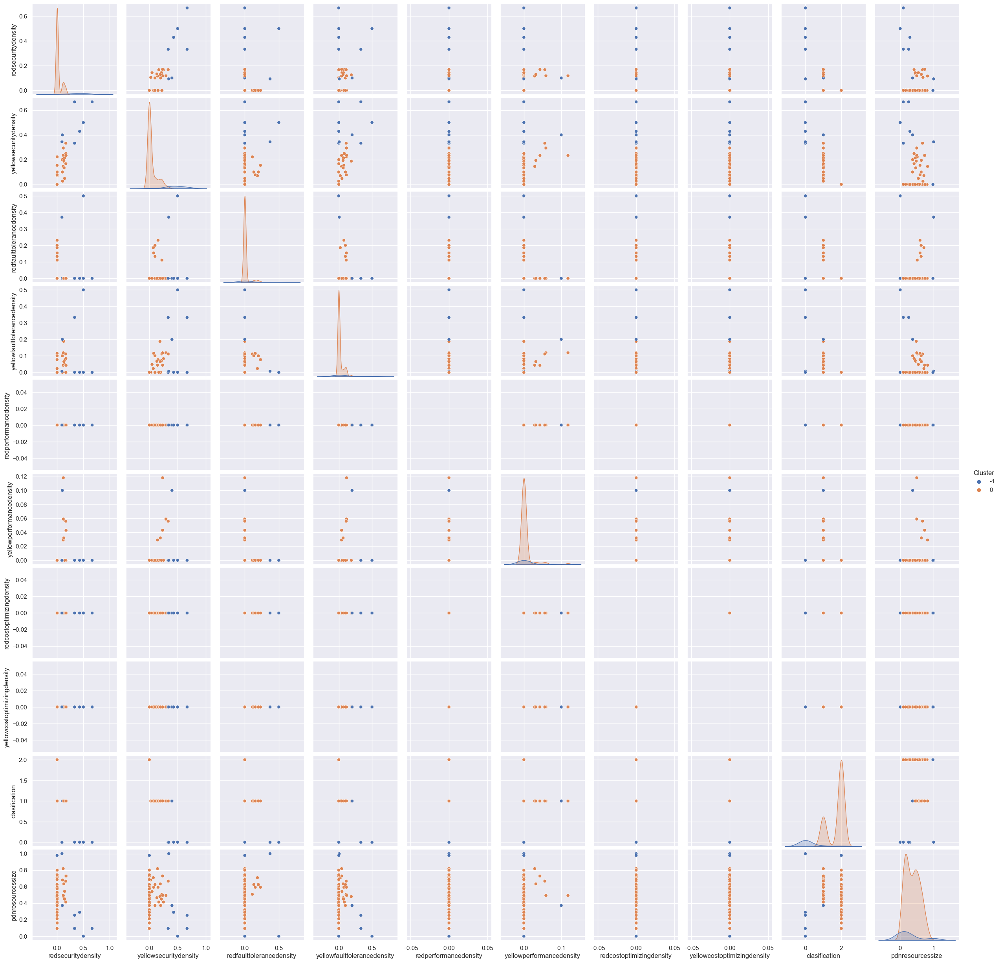

In [261]:
sns.pairplot(df_test_scaled, hue="Cluster", palette="deep")

In [271]:
df_test_scaled[df_test_scaled['Cluster'] == -1]['clasification'].value_counts()

0    10
1     1
2     1
Name: clasification, dtype: int64

In [272]:
df_test_scaled[df_test_scaled['Cluster'] == 0]['clasification'].value_counts()

2    67
1    23
Name: clasification, dtype: int64

In [273]:
# remplazar 0 (rojo) por -1
df_test_scaled['clasification'] = df_test_scaled['clasification'].replace(0, -1)
# remplazar 1, 2 (yellow y green) por 0, que es el grupo de dbscan
df_test_scaled['clasification'] = df_test_scaled['clasification'].replace(1, 0)
df_test_scaled['clasification'] = df_test_scaled['clasification'].replace(2, 0)

In [274]:
df_test_scaled['clasification'].describe()

count    102.000000
mean      -0.098039
std        0.298836
min       -1.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        0.000000
Name: clasification, dtype: float64

In [275]:
df_test_scaled[['clasification', 'Cluster']].value_counts()

clasification  Cluster
 0              0         90
-1             -1         10
 0             -1          2
dtype: int64

In [276]:
# accuracy
from sklearn.metrics import accuracy_score
accuracy_score(df_test_scaled['clasification'], df_test_scaled['Cluster'])


0.9803921568627451

In [281]:
# calculate purity of df_test_scaled
from sklearn.metrics.cluster import contingency_matrix
contingency_matrix(df_test_scaled['clasification'], df_test_scaled['Cluster'])

# calculate purity
def purity_score(y_true, y_pred):
    # compute contingency matrix (also called confusion matrix)
    contmatrix = contingency_matrix(y_true, y_pred)
    # return purity
    return np.sum(np.amax(contmatrix, axis=0)) / np.sum(contmatrix)

purity_score(df_test_scaled['clasification'], df_test_scaled['Cluster'])

0.9803921568627451

En el dataset df, se va a realizar el etiquetado de las aplicaciones que no tienen checks para que queden en el grupo de aplicaciones saludables. De esta manera el dataset df pasa de 554 a 639 aprox registros. Esto nos va a servir para luego calcular la pureza del modelo.

In [ ]:
df_green = pd.read_csv('data/fact_application_v2.csv')
# normalizacion de pdnresourcessize
df_green_scaled = MinMaxScaler().fit_transform(df_green.filter(regex='pdnresourcessize').values.reshape(-1,1))
df_green_scaled = pd.DataFrame(df_green_scaled, columns=['pdnresourcessize'], index=df_green.index)
df_green_scaled = pd.concat([df_green.drop(columns=['pdnresourcessize']), df_green_scaled], axis=1)

df_green_scaled.describe()

,redsecuritydensity,yellowsecuritydensity,redfaulttolerancedensity,yellowfaulttolerancedensity,redperformancedensity,yellowperformancedensity,redcostoptimizingdensity,yellowcostoptimizingdensity,pdnresourcessize,Cluster
count,653.000000,653.000000,653.000000,653.000000,653.000000,653.000000,653.000000,653.000000,653.000000,653.0
mean,0.027322,0.090749,0.005496,0.045643,0.000028,0.005798,0.000020,0.000544,0.360091,2.0
std,0.068309,0.120340,0.031505,0.078281,0.000501,0.019052,0.000437,0.004374,0.182301,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.0
25%,0.000000,0.015000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.238355,2.0
50%,0.000000,0.053000,0.000000,0.021000,0.000000,0.000000,0.000000,0.000000,0.404250,2.0
75%,0.023000,0.108000,0.000000,0.051000,0.000000,0.003000,0.000000,0.000000,0.478344,2.0
max,0.667000,1.000000,0.500000,0.500000,0.010000,0.250000,0.011000,0.061000,1.000000,2.0


In [ ]:
df_green_scaled = df_green_scaled.iloc[(df_green_scaled[df_green_scaled.filter(regex="density").columns]==0).all(axis=1).values,:]

# add cluster column with value 2
df_green_scaled['Cluster'] = 2
df_green_scaled.shape

(99, 11)

In [ ]:
# concat df_green_scaled with df0
df1 = pd.concat([df0, df_green_scaled], axis=0)
df1.shape

(653, 11)

In [ ]:
df1['Cluster'].value_counts()

 0    501
 2     99
-1     53
Name: Cluster, dtype: int64

### HDBScan

In [ ]:
df = pd.read_csv('data/fact_application_v2_preprocessed.csv')   

In [202]:
#apply hdbscan
import hdbscan

clusterer = hdbscan.HDBSCAN(min_cluster_size=10)
clusterer.fit(df.drop(columns=['applicationcode']))

clusterer.labels_

df['Cluster'] = clusterer.labels_

df['Cluster'].value_counts()

 2    393
 0    125
 1     32
-1      4
Name: Cluster, dtype: int64

c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


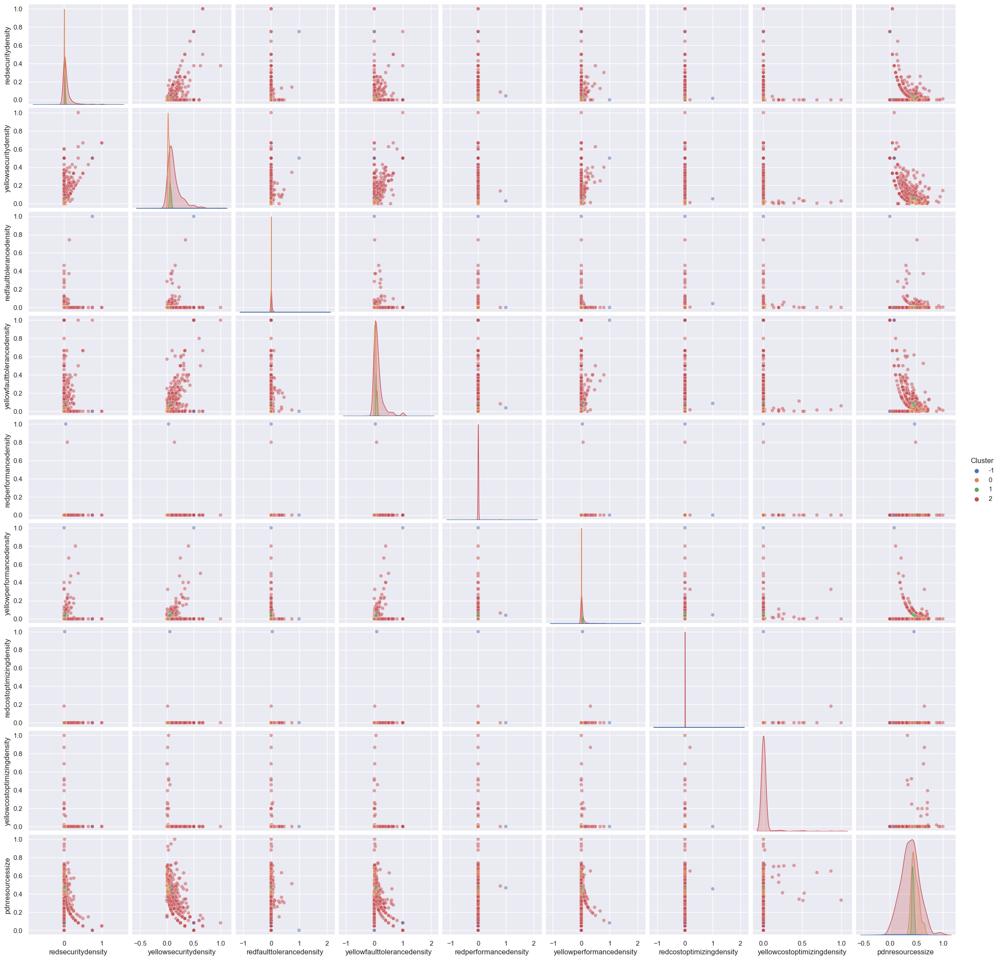

In [203]:
# pairplot
sns.set_theme(style="darkgrid")
sns.pairplot(df, hue="Cluster", palette="deep",  plot_kws={'alpha': 0.5})

HDBscan no logra hace un buen agrupamiento respecto a los datos que se tienen, seguimos con dbscan.

## Spectral Clustering

In [4]:
# load file 
df0 = pd.read_csv('data/fact_application_v2_preprocessed.csv')
df0

,applicationcode,redsecuritydensity,yellowsecuritydensity,redfaulttolerancedensity,yellowfaulttolerancedensity,redperformancedensity,yellowperformancedensity,redcostoptimizingdensity,yellowcostoptimizingdensity,pdnresourcessize
0,app00035,0.056972,0.077,0.000,0.000,0.0,0.000,0.0,0.0,0.303460
1,app00032,0.020990,0.058,0.000,0.058,0.0,0.000,0.0,0.0,0.418959
2,app00036,0.000000,0.012,0.000,0.004,0.0,0.000,0.0,0.0,0.684555
3,app00031,0.000000,0.026,0.000,0.102,0.0,0.000,0.0,0.0,0.351403
4,app00033,0.023988,0.016,0.000,0.000,0.0,0.000,0.0,0.0,0.409970
...,...,...,...,...,...,...,...,...,...,...
549,app00882,0.103448,0.092,0.046,0.022,0.0,0.000,0.0,0.0,0.446472
550,app00069,0.000000,0.032,0.000,0.032,0.0,0.000,0.0,0.0,0.408063
551,app00068,0.000000,0.167,0.000,0.200,0.0,0.132,0.0,0.0,0.320349
552,app00066,0.000000,0.013,0.000,0.000,0.0,0.000,0.0,0.0,0.428766


In [48]:
# spectral clustering using precomputed affinity matrix
from sklearn.neighbors import kneighbors_graph
from scipy.sparse import csr_matrix
A = kneighbors_graph(df0.drop(columns=['applicationcode']), 10, mode='distance', include_self=True)
A[A != 0] = 1 / A[A != 0]
A = csr_matrix(A)


c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but NearestNeighbors was fitted with feature names
  warnings.warn(


In [51]:
A.shape

(554, 554)

In [38]:
# apply spectral clustering
from sklearn.cluster import SpectralClustering

clustering = SpectralClustering(n_clusters=3,
                                assign_labels="discretize",
                                affinity='nearest_neighbors',
                                n_neighbors=10,
                                random_state=0).fit(df0.drop(columns=['applicationcode']))
df0['Cluster'] = clustering.labels_

df0['Cluster'].value_counts()

# spectral clustering using precomputed affinity matrix with weighted edges
from sklearn.neighbors import kneighbors_graph
A = kneighbors_graph(df0.drop(columns=['applicationcode']), 10, mode='distance', include_self=True)
A = A.toarray()
A[A != 0] = 1 / A[A != 0]
A = csr_matrix(A)


c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


2    313
0    186
1     55
Name: Cluster, dtype: int64

c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


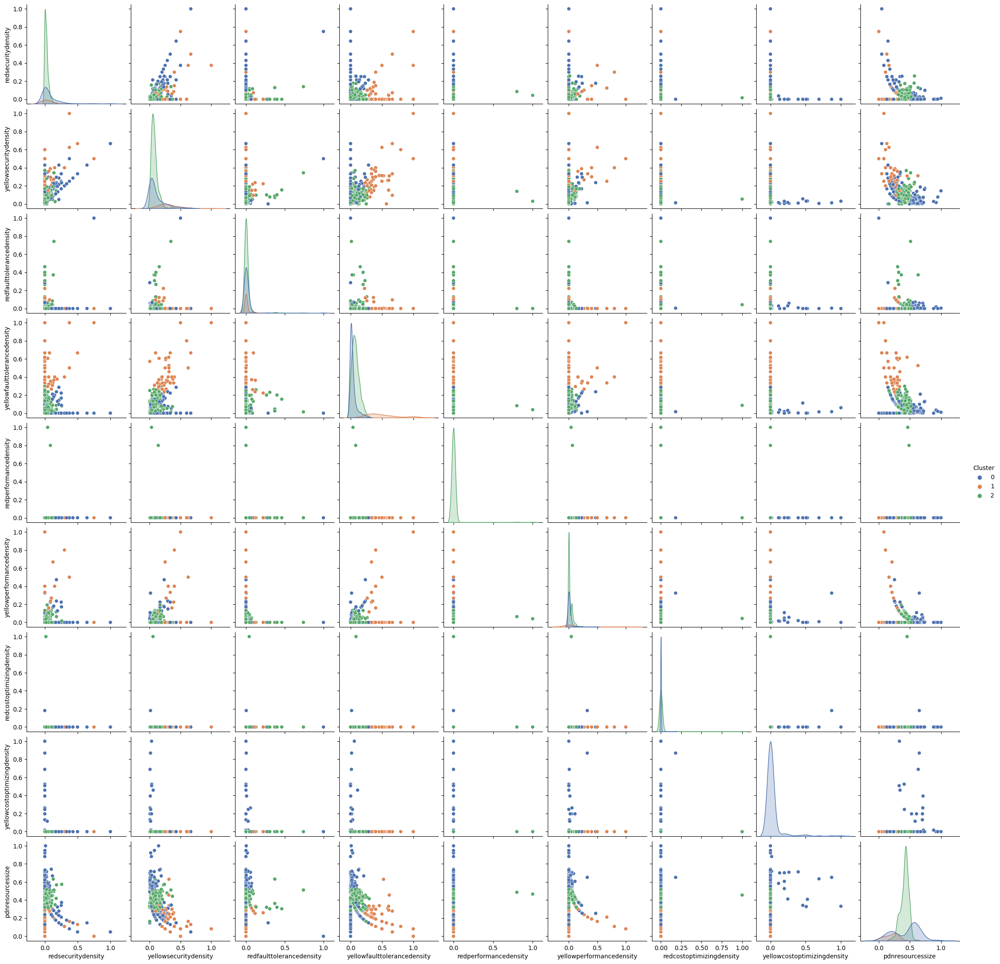

In [39]:
# pairplot
sns.pairplot(df0, hue="Cluster", palette="deep")

In [40]:
# mean of every cluster
df0.groupby('Cluster').mean().T

C:\Users\fede_\AppData\Local\Temp\ipykernel_19792\3986085684.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df0.groupby('Cluster').mean().T


Cluster,0,1,2
redsecuritydensity,0.077824,0.077825,0.025535
yellowsecuritydensity,0.103715,0.311000,0.073045
redfaulttolerancedensity,0.011032,0.013127,0.014070
yellowfaulttolerancedensity,0.034871,0.510800,0.079968
redperformancedensity,0.000000,0.000000,0.005751
yellowperformancedensity,0.020301,0.092800,0.020013
redcostoptimizingdensity,0.000978,0.000000,0.003195
yellowcostoptimizingdensity,0.031289,0.000000,0.000000
pdnresourcessize,0.448016,0.204799,0.413885


<Axes: xlabel='pdnresourcessize', ylabel='yellowcostoptimizingdensity'>

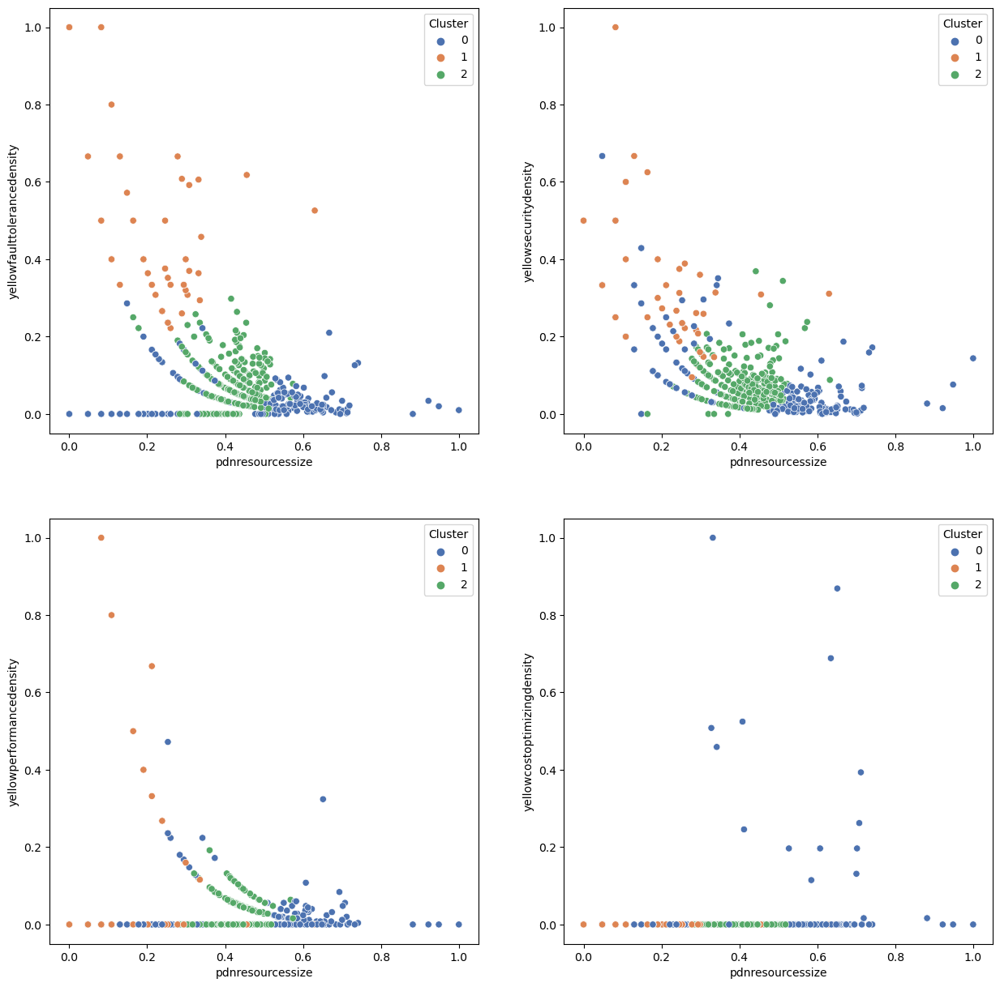

In [55]:
# scatter plot in subplots
fig, axs = plt.subplots(2, 2, figsize=(15, 15))
sns.scatterplot(data=df0, x="pdnresourcessize", y="yellowfaulttolerancedensity", hue="Cluster", palette="deep", ax=axs[0, 0])
sns.scatterplot(data=df0, x="pdnresourcessize", y="yellowsecuritydensity", hue="Cluster", palette="deep", ax=axs[0, 1])
sns.scatterplot(data=df0, x="pdnresourcessize", y="yellowperformancedensity", hue="Cluster", palette="deep", ax=axs[1, 0])
sns.scatterplot(data=df0, x="pdnresourcessize", y="yellowcostoptimizingdensity", hue="Cluster", palette="deep", ax=axs[1, 1])

### Metodo de silueta

For n_clusters = 2, the average silhouette_score is : 0.7611540780898621


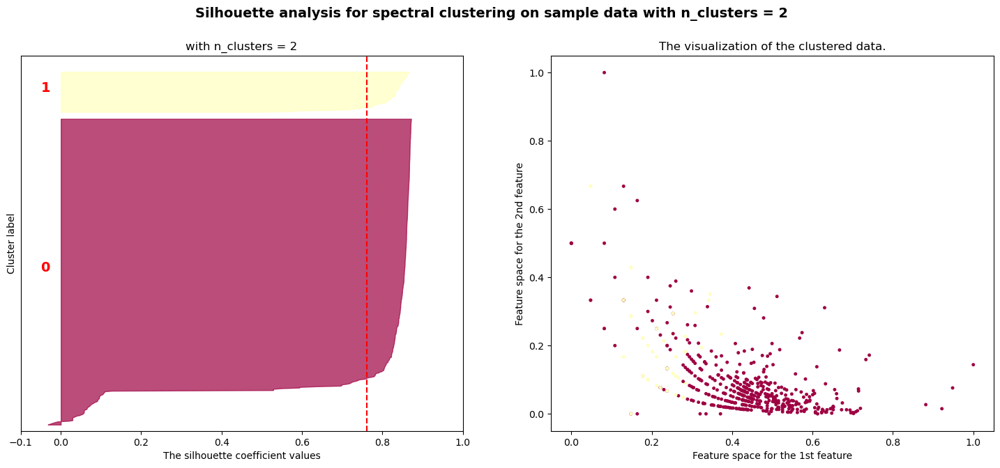

For n_clusters = 3, the average silhouette_score is : 0.7884355448014678


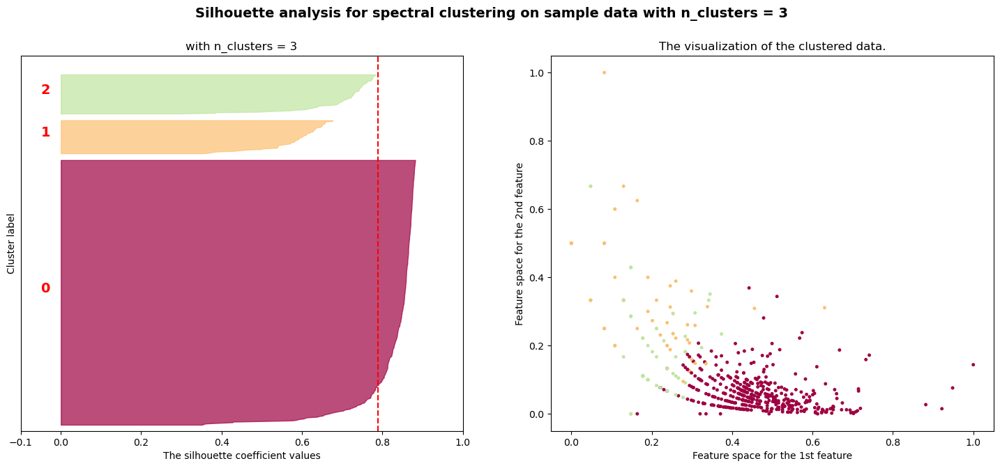

For n_clusters = 4, the average silhouette_score is : 0.7884355448014678


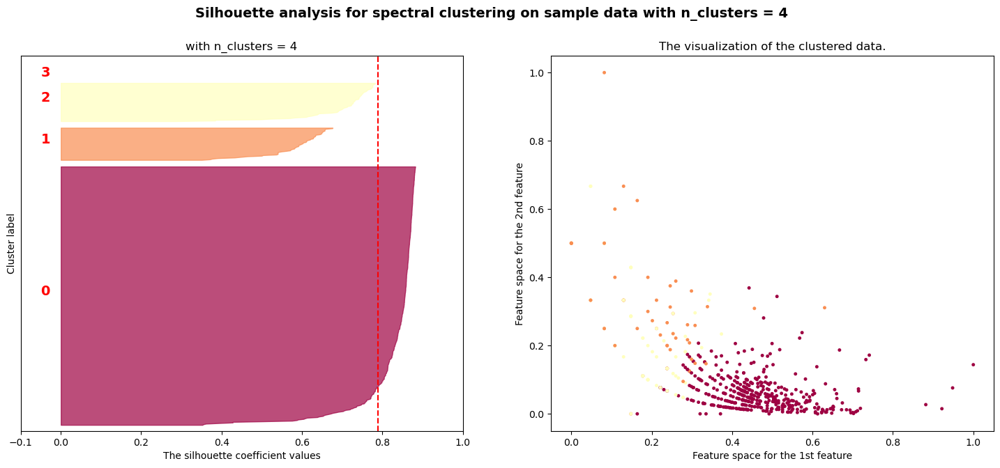

For n_clusters = 5, the average silhouette_score is : 0.750901354739333


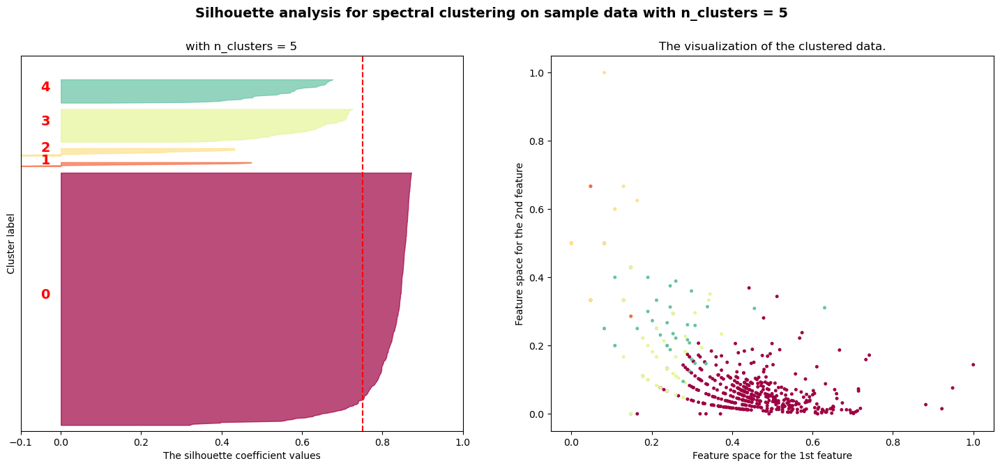

In [31]:
## apply silhouette score
from sklearn.metrics import silhouette_samples, silhouette_score

for K in range(2,6):
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(df0) + (K + 1) * 15])

    spectral = SpectralClustering(n_clusters=K, assign_labels="discretize",
                                random_state=0)
    spectral.fit(df0.drop(columns=['applicationcode']))
    y_spectral = spectral.labels_

    silhouette_avg = silhouette_score(df0.drop(columns=['applicationcode']), y_spectral)
    print(f"For n_clusters = {K}, the average silhouette_score is : {silhouette_avg}")

    sample_silhouette_values = silhouette_samples(df0.drop(columns=['applicationcode']), y_spectral)

    y_lower = 10
    for i in range(K):
        ith_cluster_silhouette_values = sample_silhouette_values[y_spectral == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = plt.colormaps.get_cmap("Spectral")(float(i) / K)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
            )

        ax1.text(
            -0.05,
            y_lower + 0.5 * size_cluster_i,
            str(i),
            color="red",
            fontweight="bold",
            fontsize=14,
            )

        y_lower = y_upper + 10
    
    
    ax1.set_title(f"with n_clusters = {K}")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    colors = plt.colormaps.get_cmap("Spectral")(y_spectral.astype(float) / K)
    ax2.scatter(df0['pdnresourcessize'], df0['yellowsecuritydensity'], marker='.', s=50, lw=0, alpha=1, c=colors, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")
    
    plt.suptitle(
        (
            f"Silhouette analysis for spectral clustering on sample data "
            f"with n_clusters = {K}"
        ),
        fontsize=14,
        fontweight="bold",
        )

    # insert
    plt.show()

In [66]:
# results interpretation
# cluster 4
df0[df0['Cluster'] == 4].describe()



,pdnresourcescount,redsecuritydensity,yellowsecuritydensity,redfaulttolerancedensity,yellowfaulttolerancedensity,redperformancedensity,yellowperformancedensity,redcostoptimizingdensity,yellowcostoptimizingdensity,pdnresourcescountlog,Cluster
count,99.000000,99.000000,99.000000,99.000000,99.000000,99.0,99.000000,99.0,99.0,99.000000,99.0
mean,22.676768,0.068808,0.249545,0.006566,0.109303,0.0,0.016121,0.0,0.0,2.743312,4.0
std,21.463224,0.089540,0.095114,0.027860,0.097177,0.0,0.035088,0.0,0.0,0.884476,0.0
min,3.000000,0.000000,0.095000,0.000000,0.000000,0.0,0.000000,0.0,0.0,1.098612,4.0
25%,7.000000,0.000000,0.173000,0.000000,0.000000,0.0,0.000000,0.0,0.0,1.945910,4.0
50%,16.000000,0.034000,0.227000,0.000000,0.100000,0.0,0.000000,0.0,0.0,2.772589,4.0
75%,27.000000,0.117000,0.313500,0.000000,0.167000,0.0,0.017000,0.0,0.0,3.295837,4.0
max,94.000000,0.429000,0.600000,0.231000,0.333000,0.0,0.200000,0.0,0.0,4.543295,4.0


In [67]:
df0[df0['Cluster'] == 3].mean()

C:\Users\fede_\AppData\Local\Temp\ipykernel_22460\2453251699.py:1: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df0[df0['Cluster'] == 3].mean()


pdnresourcescount              114.244068
redsecuritydensity               0.014417
yellowsecuritydensity            0.054936
redfaulttolerancedensity         0.003875
yellowfaulttolerancedensity      0.030793
redperformancedensity            0.000061
yellowperformancedensity         0.004769
redcostoptimizingdensity         0.000037
yellowcostoptimizingdensity      0.000224
pdnresourcescountlog             4.633711
Cluster                          3.000000
dtype: float64

In [97]:
# apply pca
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
pca.fit(df0.drop(columns=['applicationcode', 'pdnresourcescountlog']))
df0 = pca.transform(df0.drop(columns=['applicationcode', 'pdnresourcescountlog']))
pca.explained_variance_ratio_

KeyError: "['pdnresourcescountlog'] not found in axis"

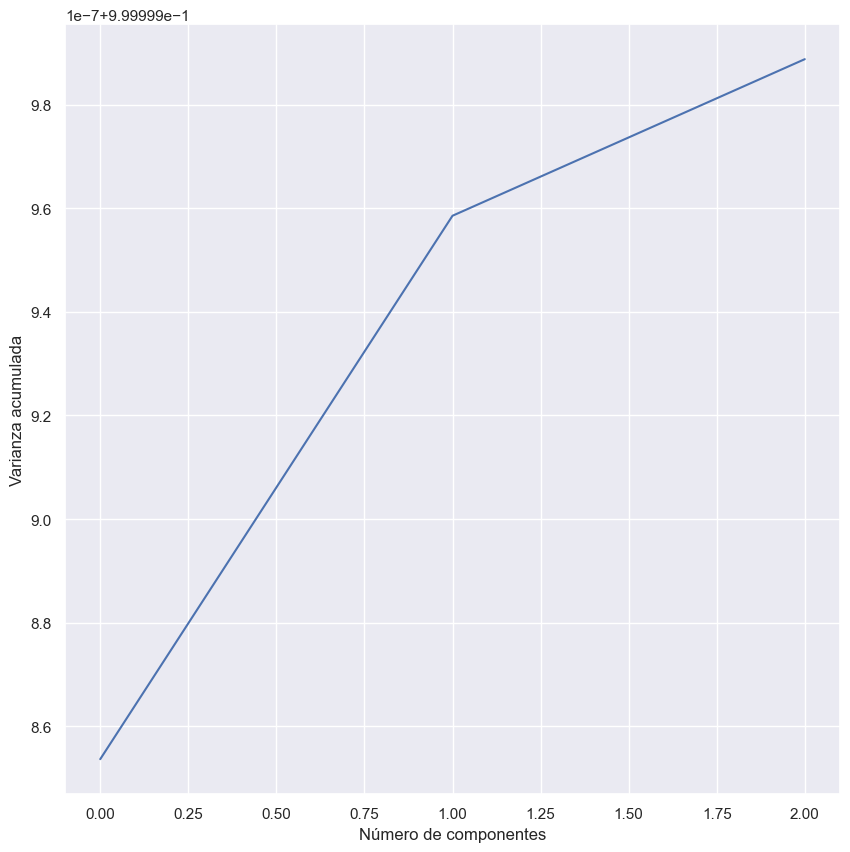

In [75]:
# plot pca
plt.figure(figsize=(10, 10))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Número de componentes')
plt.ylabel('Varianza acumulada')
plt.show()


In [90]:
df0 = pd.DataFrame(df0, columns=['pca1', 'pca2', 'pca3'])
df0

,pca1,pca2,pca3
0,-81.321116,0.067221,0.016691
1,-35.321116,0.078865,-0.045119
2,-116.321116,0.087770,0.134541
3,-126.321112,-0.110322,0.006934
4,-74.321113,-0.071510,0.022487
...,...,...,...
677,-34.321113,-0.082416,0.008056
678,-126.321112,-0.110322,0.006934
679,-125.321112,-0.110301,0.006933
680,-121.321112,-0.110219,0.006928


c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=x, y=y, **kwargs)
c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=x, y=y, **kwargs)
c:\Users\fede_\anaconda3\envs\py310\lib\site-packages\seaborn\axi

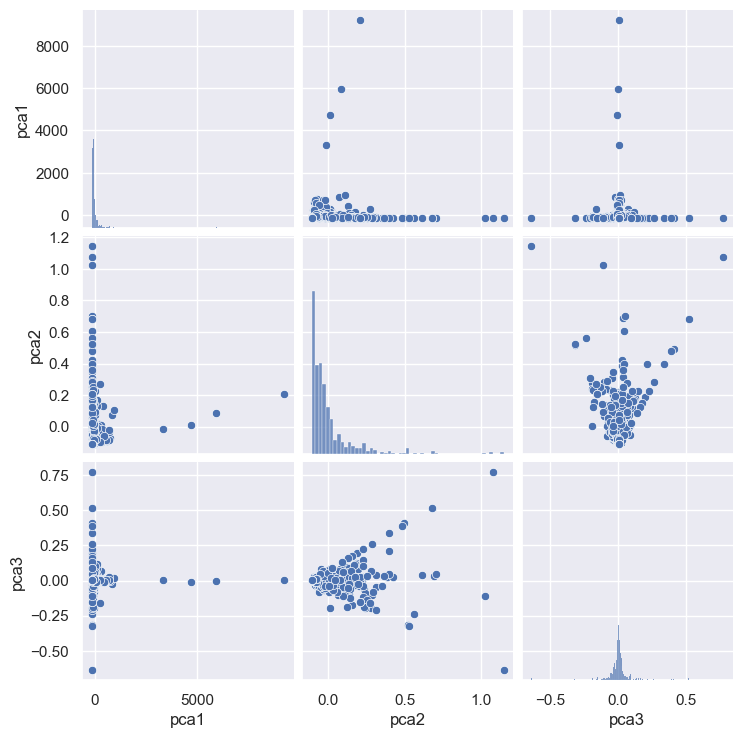

In [93]:
# plot df0
sns.pairplot(df0, palette="deep")


In [95]:
# kmeans with 3 clusters
kmeans = KMeans(n_clusters=3, random_state=42)
df0['Cluster'] = kmeans.fit_predict(df0)

ValueError: Expected 2D array, got 1D array instead:
array=[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [ ]:
sns.pairplot(data=df0, hue="Cluster", palette="deep")